# **403115089 محمدرضا شهرستانی 403115083 - حسین خموشی**

**Summary of tasks completed by team members:**

Hossein Khamooshi:
* Reviewed the exercise paper and provided brief reports.(Parts 1, 2, and 3)
* Analyzed the dataset and reported findings. (Parts 1, 2, and 3)
* Debugged the code and suggested improvements. (Parts 1, 2, and 3)
* Wrote the exercise report. (Parts 1, 2, and 3)

Mohammadreza Shahrestani:
* Performed initial preprocessing tasks. (Parts 1 and 2)
* Built a model with a Dice coefficient greater than 0.7. (Part 1)
* Displayed predicted masks compared to the ground truth. (Part 1)
* Reconstructed MRI images using a VAE model. (Part 2)
* Fine-tuned YOLOv8 model for tumor segmentation task.(Part 3)

# Kaggle configs

In [ ]:
import os
import shutil
from google.colab import drive
drive.mount('/content/drive')
kaggle_json_path = '/content/drive/MyDrive/Data_extraction_and_analysis/HW2/kaggle.json'
os.makedirs(os.path.expanduser('~/.kaggle'), exist_ok=True)
shutil.copy(kaggle_json_path, os.path.expanduser('~/.kaggle/kaggle.json'))
os.chmod(os.path.expanduser('~/.kaggle/kaggle.json'), 0o600)

Mounted at /content/drive


# **1) UNET**

## **1-2) Dataset**

### **Load datasets**
Download and unzip lgg_mri_segmentation dataset






In [ ]:
!kaggle datasets download -d mateuszbuda/lgg-mri-segmentation

!unzip -q lgg-mri-segmentation.zip -d lgg_mri_segmentation

!rm lgg-mri-segmentation.zip -f
!rm lgg_mri_segmentation/lgg-mri-segmentation -r

!ls
print(50*"-")
!ls lgg_mri_segmentation/kaggle_3m

Dataset URL: https://www.kaggle.com/datasets/mateuszbuda/lgg-mri-segmentation
License(s): CC-BY-NC-SA-4.0
100% 711M/714M [00:02<00:00, 258MB/s]
100% 714M/714M [00:02<00:00, 330MB/s]
drive  lgg_mri_segmentation  sample_data
--------------------------------------------------
data.csv	       TCGA_DU_7018_19911220  TCGA_FG_A4MU_20030903
README.md	       TCGA_DU_7019_19940908  TCGA_FG_A60K_20040224
TCGA_CS_4941_19960909  TCGA_DU_7294_19890104  TCGA_HT_7473_19970826
TCGA_CS_4942_19970222  TCGA_DU_7298_19910324  TCGA_HT_7475_19970918
TCGA_CS_4943_20000902  TCGA_DU_7299_19910417  TCGA_HT_7602_19951103
TCGA_CS_4944_20010208  TCGA_DU_7300_19910814  TCGA_HT_7605_19950916
TCGA_CS_5393_19990606  TCGA_DU_7301_19911112  TCGA_HT_7608_19940304
TCGA_CS_5395_19981004  TCGA_DU_7302_19911203  TCGA_HT_7616_19940813
TCGA_CS_5396_20010302  TCGA_DU_7304_19930325  TCGA_HT_7680_19970202
TCGA_CS_5397_20010315  TCGA_DU_7306_19930512  TCGA_HT_7684_19950816
TCGA_CS_6186_20000601  TCGA_DU_7309_19960831  TCGA_HT_7686_

In [ ]:
import pandas as pd

df = pd.read_csv("lgg_mri_segmentation/kaggle_3m/data.csv")
print(df.loc[0])
print(50*"-")
!ls lgg_mri_segmentation/kaggle_3m/TCGA_CS_4941_19960909

Patient                      TCGA_CS_4941
RNASeqCluster                         2.0
MethylationCluster                    4.0
miRNACluster                            2
CNCluster                             2.0
RPPACluster                           NaN
OncosignCluster                       3.0
COCCluster                              2
histological_type                     1.0
neoplasm_histologic_grade             2.0
tumor_tissue_site                     1.0
laterality                            3.0
tumor_location                        2.0
gender                                2.0
age_at_initial_pathologic            67.0
race                                  3.0
ethnicity                             2.0
death01                               1.0
Name: 0, dtype: object
--------------------------------------------------
TCGA_CS_4941_19960909_10_mask.tif  TCGA_CS_4941_19960909_20.tif
TCGA_CS_4941_19960909_10.tif	   TCGA_CS_4941_19960909_21_mask.tif
TCGA_CS_4941_19960909_11_mask.tif  TCGA_

#### Show sample image

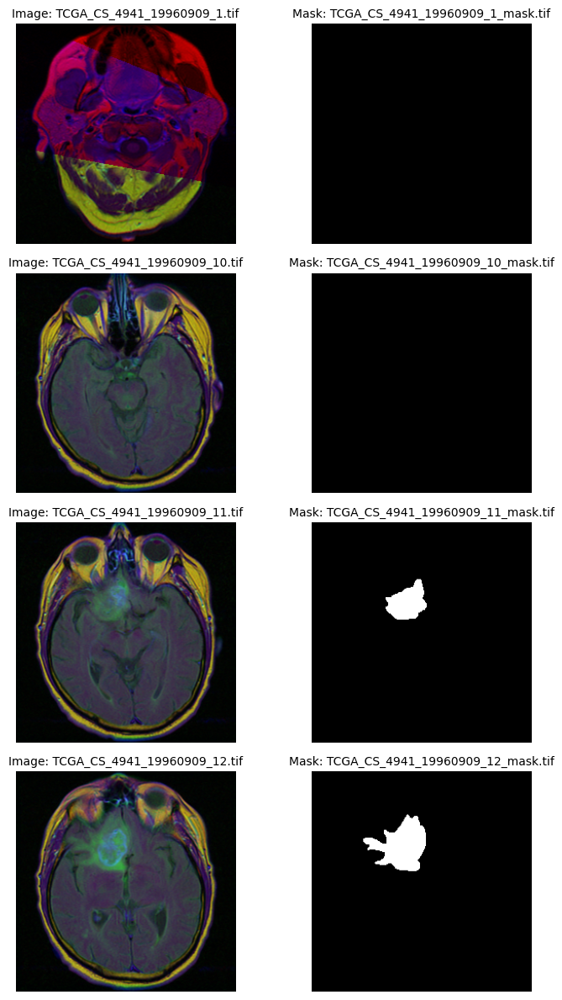

In [ ]:
import matplotlib.pyplot as plt
import os
import tifffile

patient_dir = "lgg_mri_segmentation/kaggle_3m/TCGA_CS_4941_19960909"
all_images = sorted([f for f in os.listdir(patient_dir) if f.endswith(".tif") and "_mask" not in f])

images_to_show = all_images[:4]

cols = 2  # One column for the image, one for the corresponding mask
rows = len(images_to_show)

plt.figure(figsize=(8, rows * 3))  # Width: 8 inches, height scaled by number of images

for i, img_name in enumerate(images_to_show):
    img_path = os.path.join(patient_dir, img_name)
    mask_name = img_name.replace(".tif", "_mask.tif")
    mask_path = os.path.join(patient_dir, mask_name)

    img = tifffile.imread(img_path)

    # Show the image
    plt.subplot(rows, cols, 2*i + 1)
    plt.imshow(img)
    plt.title(f"Image: {img_name}", fontsize=10)
    plt.axis("off")

    # Show the mask if it exists, otherwise display text indicating no mask
    if os.path.exists(mask_path):
        mask = tifffile.imread(mask_path)
    else:
        mask = None

    plt.subplot(rows, cols, 2*i + 2)
    if mask is not None:
        plt.imshow(mask, cmap="gray")
        plt.title(f"Mask: {mask_name}", fontsize=10)
    else:
        plt.text(0.5, 0.5, "No mask", ha="center", va="center", fontsize=12)
    plt.axis("off")

plt.tight_layout()
plt.show()

### **Preprocessing**

In [ ]:
import os
import shutil

# Path to the source directory (which includes subdirectories)
source_dir = 'lgg_mri_segmentation/kaggle_3m/'

# Path to the destination directory
destination_dir = 'dataset'

# Create the destination directory if it doesn't exist
os.makedirs(destination_dir, exist_ok=True)

# Counter for moved files
moved_count = 0

# Traverse all files in subdirectories
for root, dirs, files in os.walk(source_dir):
    for file in files:
        source_file_path = os.path.join(root, file)
        destination_file_path = os.path.join(destination_dir, file)

        # Move the file only if it doesn't already exist in the destination
        if not os.path.exists(destination_file_path):
            shutil.move(source_file_path, destination_file_path)
            print(f"Moved: {source_file_path} → {destination_file_path}")
            moved_count += 1
        else:
            print(f"Skipped (already exists): {destination_file_path}")

print(f"\nFile transfer completed. Total files moved: {moved_count}")

!rm lgg_mri_segmentation -r

Streaming output truncated to the last 5000 lines.
Moved: lgg_mri_segmentation/kaggle_3m/TCGA_CS_6669_20020102/TCGA_CS_6669_20020102_21.tif → dataset/TCGA_CS_6669_20020102_21.tif
Moved: lgg_mri_segmentation/kaggle_3m/TCGA_CS_6669_20020102/TCGA_CS_6669_20020102_7_mask.tif → dataset/TCGA_CS_6669_20020102_7_mask.tif
Moved: lgg_mri_segmentation/kaggle_3m/TCGA_CS_6669_20020102/TCGA_CS_6669_20020102_9_mask.tif → dataset/TCGA_CS_6669_20020102_9_mask.tif
Moved: lgg_mri_segmentation/kaggle_3m/TCGA_CS_6669_20020102/TCGA_CS_6669_20020102_16_mask.tif → dataset/TCGA_CS_6669_20020102_16_mask.tif
Moved: lgg_mri_segmentation/kaggle_3m/TCGA_CS_6669_20020102/TCGA_CS_6669_20020102_5_mask.tif → dataset/TCGA_CS_6669_20020102_5_mask.tif
Moved: lgg_mri_segmentation/kaggle_3m/TCGA_CS_6669_20020102/TCGA_CS_6669_20020102_14.tif → dataset/TCGA_CS_6669_20020102_14.tif
Moved: lgg_mri_segmentation/kaggle_3m/TCGA_CS_6669_20020102/TCGA_CS_6669_20020102_10.tif → dataset/TCGA_CS_6669_20020102_10.tif
Moved: lgg_mri_segm

#### Resize images

In [ ]:
from PIL import Image

# Function to resize images
def resize_images(folder_path, common_size):
    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)

        if os.path.isfile(file_path):
            try:
                img = Image.open(file_path)
                img_resized = img.resize(common_size)
                img_resized.save(file_path)
                print(f"{filename} resized to {common_size}.")
            except Exception as e:
                print(f"Error processing {filename}: {e}")

dataset_folder = 'dataset'
resize_images(dataset_folder, (64, 64))

Streaming output truncated to the last 5000 lines.
TCGA_CS_4942_19970222_10_mask.tif resized to (64, 64).
TCGA_CS_5395_19981004_5.tif resized to (64, 64).
TCGA_FG_5964_20010511_17.tif resized to (64, 64).
TCGA_CS_6668_20011025_10_mask.tif resized to (64, 64).
TCGA_DU_6400_19830518_46.tif resized to (64, 64).
TCGA_HT_8111_19980330_3.tif resized to (64, 64).
TCGA_FG_7634_20000128_20_mask.tif resized to (64, 64).
TCGA_HT_8113_19930809_19.tif resized to (64, 64).
TCGA_HT_8105_19980826_25_mask.tif resized to (64, 64).
TCGA_FG_7634_20000128_2_mask.tif resized to (64, 64).
TCGA_DU_8162_19961029_2.tif resized to (64, 64).
TCGA_HT_A616_19991226_11.tif resized to (64, 64).
TCGA_DU_6404_19850629_5_mask.tif resized to (64, 64).
TCGA_FG_6690_20020226_56.tif resized to (64, 64).
TCGA_DU_7306_19930512_4.tif resized to (64, 64).
TCGA_HT_7860_19960513_18_mask.tif resized to (64, 64).
TCGA_HT_7877_19980917_18.tif resized to (64, 64).
TCGA_DU_8163_19961119_3.tif resized to (64, 64).
TCGA_FG_7643_20021104

#### Show sample image after resize

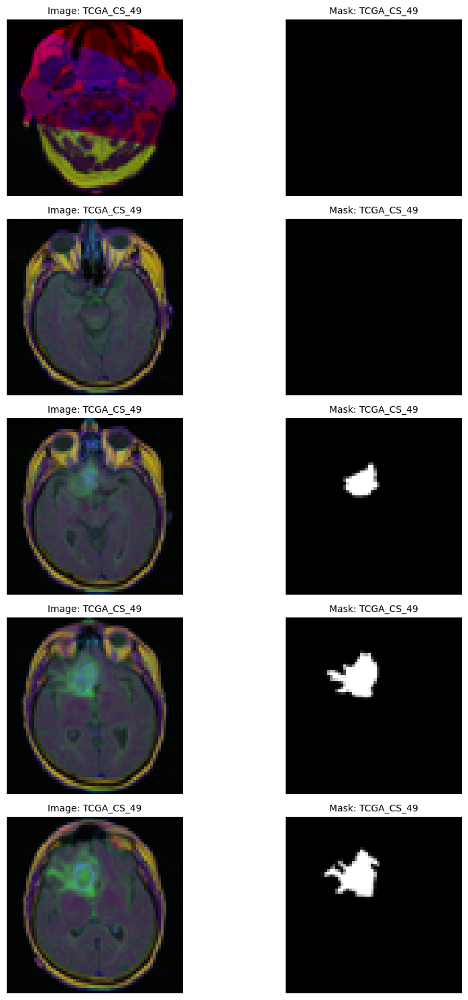

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

def show_resized_images_with_masks(folder_path, num_samples=3):
    # Get all image files excluding masks
    image_files = sorted([f for f in os.listdir(folder_path)
                          if f.endswith(".tif") and "_mask" not in f])[:num_samples]

    rows = num_samples  # Number of images to show
    cols = 2  # One column for the image, one for the corresponding mask

    plt.figure(figsize=(10, rows * 3))  # Adjusting size based on number of images

    for i, filename in enumerate(image_files):
        image_path = os.path.join(folder_path, filename)
        mask_name = filename.replace(".tif", "_mask.tif")
        mask_path = os.path.join(folder_path, mask_name)

        # Load image and mask
        img = Image.open(image_path)
        mask = Image.open(mask_path) if os.path.exists(mask_path) else None

        # Show the image
        plt.subplot(rows, cols, 2 * i + 1)
        plt.imshow(img)
        plt.title(f"Image: {filename[:10]}", fontsize=10)  # Display first 10 chars of the filename
        plt.axis("off")

        # Show the mask
        plt.subplot(rows, cols, 2 * i + 2)
        if mask:
            plt.imshow(mask, cmap='gray')
            plt.title(f"Mask: {mask_name[:10]}", fontsize=10)  # Display first 10 chars of the mask filename
        else:
            plt.text(0.5, 0.5, "No mask found", ha='center', va='center', fontsize=12)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Show 5 images with their masks
show_resized_images_with_masks("dataset", num_samples=5)


### **Data Augmentation**

In [ ]:
import os
import shutil
import cv2
from tqdm import tqdm
import albumentations as A

# Main input directory
input_dir = "dataset"

# Output directory for augmented data
augmented_dir = "augmented_data"

# Number of augmented samples per original image
N_AUG = 1

# Albumentations augmentation pipeline
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=15, p=0.7),
    A.RandomBrightnessContrast(p=0.3),
    A.GaussNoise(var_limit=(10.0, 50.0), p=0.2)
])

# Recreate the output directory
if os.path.exists(augmented_dir):
    shutil.rmtree(augmented_dir)
os.makedirs(augmented_dir)

# Get all .tif files that are not masks
all_images = sorted([f for f in os.listdir(input_dir) if f.endswith(".tif") and "_mask" not in f])

all_data = []

print("🔄 Starting data augmentation...")
for img_file in tqdm(all_images):
    img_path = os.path.join(input_dir, img_file)
    mask_path = img_path.replace(".tif", "_mask.tif")

    # Skip if corresponding mask does not exist
    if not os.path.exists(mask_path):
        print(f"⚠️  Skipping {img_file} — mask not found.")
        continue

    # Read image (color) and mask (grayscale)
    img = cv2.imread(img_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    base_name = img_file.replace(".tif", "")

    # Save original image and mask
    cv2.imwrite(os.path.join(augmented_dir, base_name + ".tif"), img)
    cv2.imwrite(os.path.join(augmented_dir, base_name + "_mask.tif"), mask)
    all_data.append(base_name)

    # Generate augmentations
    for i in range(N_AUG):
        augmented = transform(image=img, mask=mask)
        aug_img = augmented["image"]
        aug_mask = augmented["mask"]

        aug_name = f"{base_name}_aug{i}"
        cv2.imwrite(os.path.join(augmented_dir, aug_name + ".tif"), aug_img)
        cv2.imwrite(os.path.join(augmented_dir, aug_name + "_mask.tif"), aug_mask)
        all_data.append(aug_name)

# Final summary
!ls augmented_data
print(f"\n✅ Data augmentation completed.")
print(f"🖼️  Total images (including masks): {len(all_data) * 2}")
print(f"📂 Saved in: {augmented_dir}")


/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:111: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
<ipython-input-51-ccec5928d9be>:22: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.2)


🔄 Starting data augmentation...


100%|██████████| 3929/3929 [00:09<00:00, 395.46it/s]


Streaming output truncated to the last 5000 lines.
TCGA_DU_6399_19830416_10_mask.tif	TCGA_FG_7643_20021104_9_aug0_mask.tif
TCGA_DU_6399_19830416_10.tif		TCGA_FG_7643_20021104_9_aug0.tif
TCGA_DU_6399_19830416_11_aug0_mask.tif	TCGA_FG_7643_20021104_9_mask.tif
TCGA_DU_6399_19830416_11_aug0.tif	TCGA_FG_7643_20021104_9.tif
TCGA_DU_6399_19830416_11_mask.tif	TCGA_FG_8189_20030516_10_aug0_mask.tif
TCGA_DU_6399_19830416_11.tif		TCGA_FG_8189_20030516_10_aug0.tif
TCGA_DU_6399_19830416_12_aug0_mask.tif	TCGA_FG_8189_20030516_10_mask.tif
TCGA_DU_6399_19830416_12_aug0.tif	TCGA_FG_8189_20030516_10.tif
TCGA_DU_6399_19830416_12_mask.tif	TCGA_FG_8189_20030516_11_aug0_mask.tif
TCGA_DU_6399_19830416_12.tif		TCGA_FG_8189_20030516_11_aug0.tif
TCGA_DU_6399_19830416_13_aug0_mask.tif	TCGA_FG_8189_20030516_11_mask.tif
TCGA_DU_6399_19830416_13_aug0.tif	TCGA_FG_8189_20030516_11.tif
TCGA_DU_6399_19830416_13_mask.tif	TCGA_FG_8189_20030516_12_aug0_mask.tif
TCGA_DU_6399_19830416_13.tif		TCGA_FG_8189_20030516_12_aug0.t

#### Show sample image after augmentation

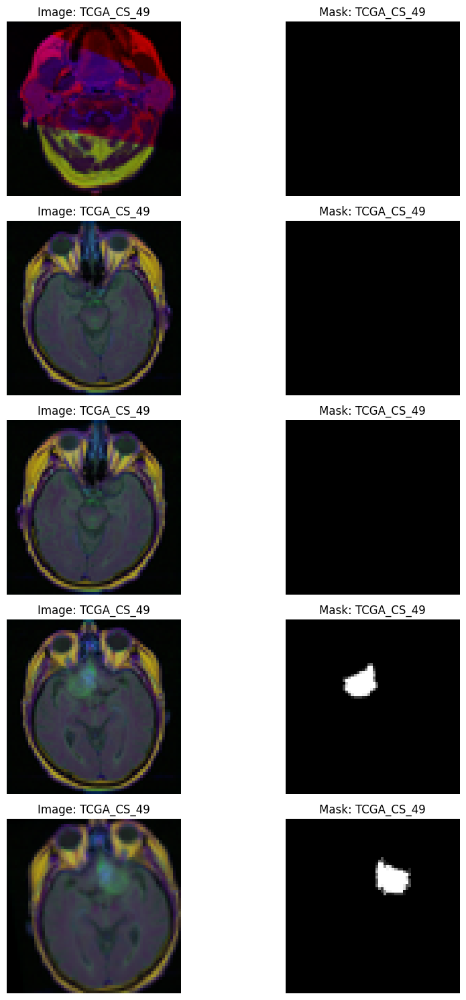

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

def show_augmented_images_with_masks(folder_path, num_samples=3):
    # Get image filenames (excluding masks)
    image_files = sorted([
        f for f in os.listdir(folder_path)
        if f.endswith(".tif") and "_mask" not in f
    ])[:num_samples]

    rows = num_samples  # Number of image-mask pairs to show
    cols = 2  # One column for the image, one for the corresponding mask

    plt.figure(figsize=(10, rows * 3))  # Adjust figure size based on number of samples

    for i, filename in enumerate(image_files):
        image_path = os.path.join(folder_path, filename)
        mask_name = filename.replace(".tif", "_mask.tif")
        mask_path = os.path.join(folder_path, mask_name)

        # Load image and corresponding mask
        img = Image.open(image_path)
        mask = Image.open(mask_path) if os.path.exists(mask_path) else None

        # Display image
        plt.subplot(rows, cols, 2 * i + 1)
        plt.imshow(img)
        plt.title(f"Image: {filename[:10]}")
        plt.axis("off")

        # Display corresponding mask
        plt.subplot(rows, cols, 2 * i + 2)
        if mask:
            plt.imshow(mask, cmap='gray')
            plt.title(f"Mask: {mask_name[:10]}")
        else:
            plt.text(0.5, 0.5, "No mask found", ha='center', va='center')
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Show 5 augmented image-mask pairs
show_augmented_images_with_masks("augmented_data", num_samples=5)


### **Split Dataset**

In [ ]:
import os
import shutil
import random

# Main input directory
input_dir = "dataset"
augmented_dir = "augmented_data"

# Directories for train, validation, and test sets
train_dir = "dataset/train"
val_dir = "dataset/val"
test_dir = "dataset/test"

# Ratio for splitting
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

# Get all .tif files (excluding masks)
all_images = sorted([f for f in os.listdir(input_dir) if f.endswith(".tif") and "_mask" not in f])

# Shuffle the images randomly
random.shuffle(all_images)

# Calculate split sizes
total_images = len(all_images)
train_size = int(train_ratio * total_images)
val_size = int(val_ratio * total_images)
test_size = total_images - train_size - val_size  # The rest goes to test

# Create the directories if they don't exist
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Function to move images to the appropriate directory
def move_files(image_list, target_dir):
    for img_file in image_list:
        img_path = os.path.join(input_dir, img_file)
        mask_path = img_path.replace(".tif", "_mask.tif")

        # Move image and its mask to the target directory
        if os.path.exists(mask_path):
            # Move image
            shutil.move(img_path, os.path.join(target_dir, img_file))
            # Move mask
            shutil.move(mask_path, os.path.join(target_dir, img_file.replace(".tif", "_mask.tif")))

# Split the data
train_images = all_images[:train_size]
val_images = all_images[train_size:train_size + val_size]
test_images = all_images[train_size + val_size:]

# Move original images and masks to respective directories
move_files(train_images, train_dir)
move_files(val_images, val_dir)
move_files(test_images, test_dir)

# Handle augmented data (only for training set)
augmented_images = sorted([f for f in os.listdir(augmented_dir) if f.endswith(".tif") and "_mask" not in f])
augmented_masks = sorted([f for f in os.listdir(augmented_dir) if f.endswith("_mask.tif")])

# Move augmented images and masks to the training directory
for img_file in augmented_images:
    img_path = os.path.join(augmented_dir, img_file)
    mask_path = img_path.replace(".tif", "_mask.tif")

    # Move image and its mask to the train directory
    if os.path.exists(mask_path):
        shutil.move(img_path, os.path.join(train_dir, img_file))
        shutil.move(mask_path, os.path.join(train_dir, img_file.replace(".tif", "_mask.tif")))

!rm augmented_data -r
# Print the number of files in each set
print(f"✅ Data split completed.")
print(f"📂 Training set: {len(train_images) + len(augmented_images)} images (including masks)")
print(f"📂 Validation set: {len(val_images)} images (including masks)")
print(f"📂 Test set: {len(test_images)} images (including masks)")


✅ Data split completed.
📂 Training set: 10608 images (including masks)
📂 Validation set: 589 images (including masks)
📂 Test set: 590 images (including masks)


## **1-3) Evaluation score**

In [ ]:
# Weighted Dice Loss
def weighted_dice_loss(y_true, y_pred, smooth=1e-6, weight=5.0):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    w = y_true_f * weight + (1 - y_true_f)  # weight for foreground
    intersection = K.sum(w * y_true_f * y_pred_f)
    union = K.sum(w * y_true_f + w * y_pred_f)
    return 1 - (2. * intersection + smooth) / (union + smooth)

def dice_coefficient(y_true, y_pred, smooth=1e-6):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    union = K.sum(y_true_f) + K.sum(y_pred_f)
    return (2. * intersection + smooth) / (union + smooth)

def iou_score(y_true, y_pred, smooth=1e-6):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    union = K.sum(y_true_f) + K.sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

## **1-4) UNet-VGG16 Architecture**

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import VGG16

def unet_vgg16_transfer(input_size=(64, 64, 3)):
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_size)
    for layer in base_model.layers:
        layer.trainable = False  # Freeze pretrained layers

    # Use skip connections from VGG16
    block1 = base_model.get_layer("block1_conv2").output
    block2 = base_model.get_layer("block2_conv2").output
    block3 = base_model.get_layer("block3_conv3").output
    block4 = base_model.get_layer("block4_conv3").output
    block5 = base_model.get_layer("block5_conv3").output

    # Decoder path
    up1 = UpSampling2D()(block5)
    up1 = concatenate([up1, block4])
    up1 = Conv2D(512, 3, activation='relu', padding='same')(up1)

    up2 = UpSampling2D()(up1)
    up2 = concatenate([up2, block3])
    up2 = Conv2D(256, 3, activation='relu', padding='same')(up2)

    up3 = UpSampling2D()(up2)
    up3 = concatenate([up3, block2])
    up3 = Conv2D(128, 3, activation='relu', padding='same')(up3)

    up4 = UpSampling2D()(up3)
    up4 = concatenate([up4, block1])
    up4 = Conv2D(64, 3, activation='relu', padding='same')(up4)

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(up4)

    model = Model(inputs=base_model.input, outputs=outputs)
    return model


# model
model = unet_vgg16_transfer(input_size=(64, 64, 3))

# Summary of the model
model.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 64, 64,    │      1,792 │ input_layer[0][0] │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 64, 64,    │     36,928 │ block1_conv1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_pool         │ (None, 32, 32,    │          0 │ block1_conv2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv1        │ (None, 32, 32,    │     73,856 │ block1_pool[0][0] │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv2        │ (None, 32, 32,    │    147,584 │ block2_conv1[0][… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 16, 16,    │          0 │ block2_conv2[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv1        │ (None, 16, 16,    │    295,168 │ block2_pool[0][0] │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv2        │ (None, 16, 16,    │    590,080 │ block3_conv1[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv3        │ (None, 16, 16,    │    590,080 │ block3_conv2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_pool         │ (None, 8, 8, 256) │          0 │ block3_conv3[0][… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv1        │ (None, 8, 8, 512) │  1,180,160 │ block3_pool[0][0] │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv2        │ (None, 8, 8, 512) │  2,359,808 │ block4_conv1[0][… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv3        │ (None, 8, 8, 512) │  2,359,808 │ block4_conv2[0][… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_pool         │ (None, 4, 4, 512) │          0 │ block4_conv3[0][… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv1        │ (None, 4, 4, 512) │  2,359,808 │ block4_pool[0][0] │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv2        │ (None, 4, 4, 512) │  2,359,808 │ block5_conv1[0][

 Total params: 21,756,737 (83.00 MB)

 Trainable params: 7,042,049 (26.86 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

## **1-5) Model Training**

### **Data Loader**

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import Sequence

# Settings
image_size = (64, 64)
batch_size = 16
epochs = 10
train_dir = "dataset/train"
val_dir = "dataset/val"
test_dir = "dataset/test"

# Custom Data Generator
class ImageMaskGenerator(Sequence):
    def __init__(self, folder, batch_size=8, image_size=image_size, shuffle=True):
        self.folder = folder
        self.batch_size = batch_size
        self.image_size = image_size
        self.shuffle = shuffle
        self.image_files = sorted([f for f in os.listdir(folder) if f.endswith(".tif") and "_mask" not in f])
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.image_files) / self.batch_size))

    def __getitem__(self, index):
        batch_files = self.image_files[index * self.batch_size:(index + 1) * self.batch_size]
        images, masks = [], []

        for img_file in batch_files:
            img_path = os.path.join(self.folder, img_file)
            mask_path = img_path.replace(".tif", "_mask.tif")

            if not os.path.exists(mask_path):
                continue

            img = load_img(img_path, target_size=self.image_size)
            mask = load_img(mask_path, target_size=self.image_size, color_mode="grayscale")

            img = img_to_array(img) / 255.0
            mask = img_to_array(mask) / 255.0
            mask = (mask > 0.5).astype(np.float32)

            images.append(img)
            masks.append(mask)

        return np.array(images), np.array(masks)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.image_files)

# Load Data Using Generator
train_gen = ImageMaskGenerator(train_dir, batch_size=batch_size)
val_gen = ImageMaskGenerator(val_dir, batch_size=batch_size)
test_gen = ImageMaskGenerator(test_dir, batch_size=batch_size, shuffle=False)

### **Train**

In [ ]:

# Compile and Train the Model
model.compile(optimizer=Adam(1e-4),
              loss=weighted_dice_loss,
              metrics=[dice_coefficient, iou_score, 'accuracy'])

history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=epochs
)


Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


492/492 ━━━━━━━━━━━━━━━━━━━━ 2429s 5s/step - accuracy: 0.9823 - dice_coefficient: 0.5054 - iou_score: 0.3582 - loss: 0.2993 - val_accuracy: 0.9941 - val_dice_coefficient: 0.7396 - val_iou_score: 0.5903 - val_loss: 0.1104
Epoch 2/10
492/492 ━━━━━━━━━━━━━━━━━━━━ 2409s 5s/step - accuracy: 0.9916 - dice_coefficient: 0.6588 - iou_score: 0.5051 - loss: 0.1667 - val_accuracy: 0.9902 - val_dice_coefficient: 0.6472 - val_iou_score: 0.4842 - val_loss: 0.1137
Epoch 3/10
492/492 ━━━━━━━━━━━━━━━━━━━━ 2416s 5s/step - accuracy: 0.9927 - dice_coefficient: 0.6863 - iou_score: 0.5347 - loss: 0.1414 - val_accuracy: 0.9924 - val_dice_coefficient: 0.6800 - val_iou_score: 0.5241 - val_loss: 0.1043
Epoch 4/10
492/492 ━━━━━━━━━━━━━━━━━━━━ 2393s 5s/step - accuracy: 0.9935 - dice_coefficient: 0.7149 - iou_score: 0.5679 - loss: 0.1287 - val_accuracy: 0.9947 - val_dice_coefficient: 0.7578 - val_iou_score: 0.6165 - val_loss: 0.0811
Epoch 5/10
492/492 ━━━━━━━━━━━━━━━━━━━━ 2387s 5s/step - accuracy: 0.9941 - dice_coe

### **Plot Training and Validation Metrics**


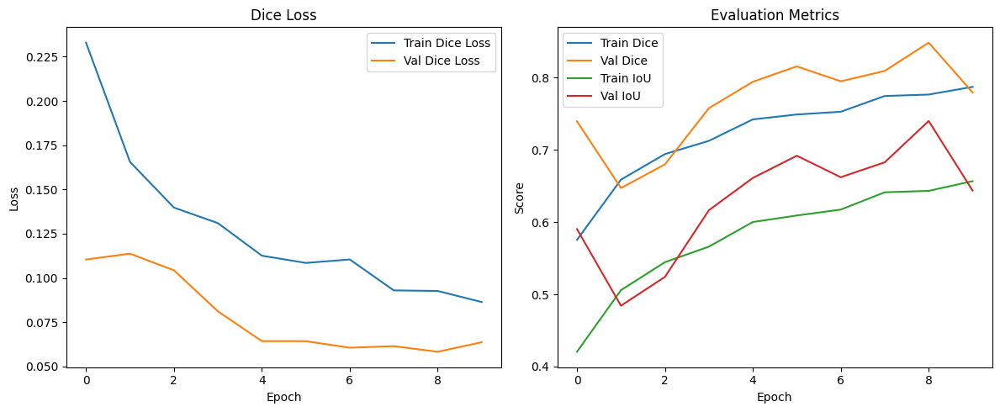

37/37 ━━━━━━━━━━━━━━━━━━━━ 72s 2s/step - accuracy: 0.9948 - dice_coefficient: 0.7565 - iou_score: 0.6323 - loss: 0.0990

📊 Final Evaluation on Test Set:
Loss (Dice Loss): 0.0839
Dice Coefficient: 0.7791
IoU Score: 0.6570
Accuracy: 0.9955


In [ ]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Dice Loss')
plt.plot(history.history['val_loss'], label='Val Dice Loss')
plt.title("Dice Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['dice_coefficient'], label='Train Dice')
plt.plot(history.history['val_dice_coefficient'], label='Val Dice')
plt.plot(history.history['iou_score'], label='Train IoU')
plt.plot(history.history['val_iou_score'], label='Val IoU')
plt.title("Evaluation Metrics")
plt.xlabel("Epoch")
plt.ylabel("Score")
plt.legend()
plt.tight_layout()
plt.show()

# Final Evaluation on Test Data
results = model.evaluate(test_gen)
print("\n📊 Final Evaluation on Test Set:")
print(f"Loss (Dice Loss): {results[0]:.4f}")
print(f"Dice Coefficient: {results[1]:.4f}")
print(f"IoU Score: {results[2]:.4f}")
print(f"Accuracy: {results[3]:.4f}")

## **1-6) Model Evaluation**

### **Show predicted mask of random samples.**

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


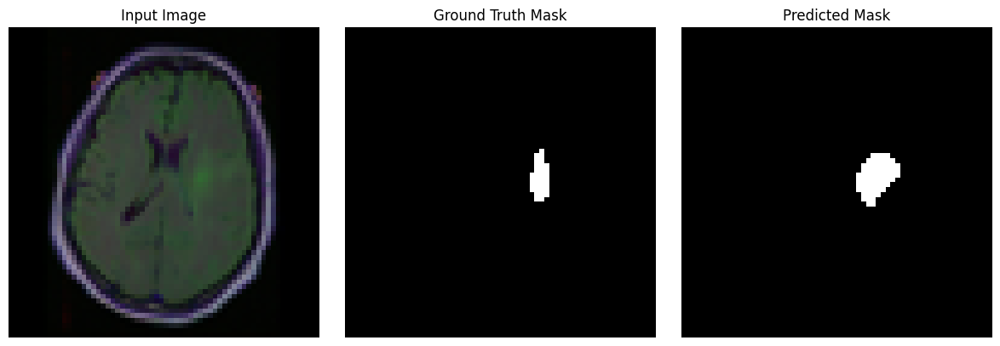

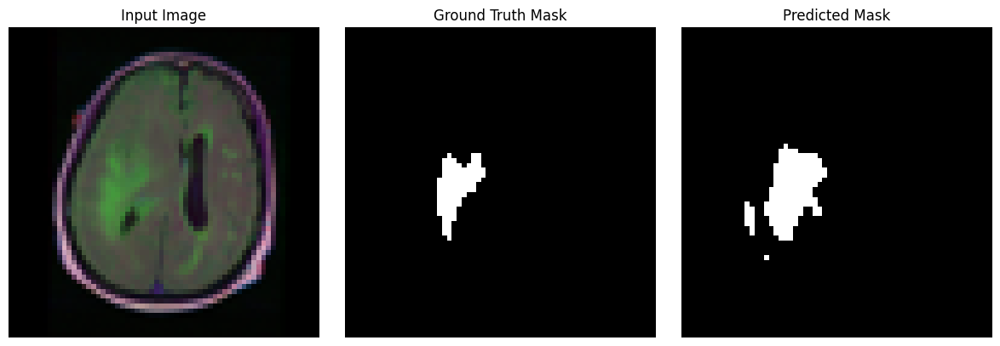

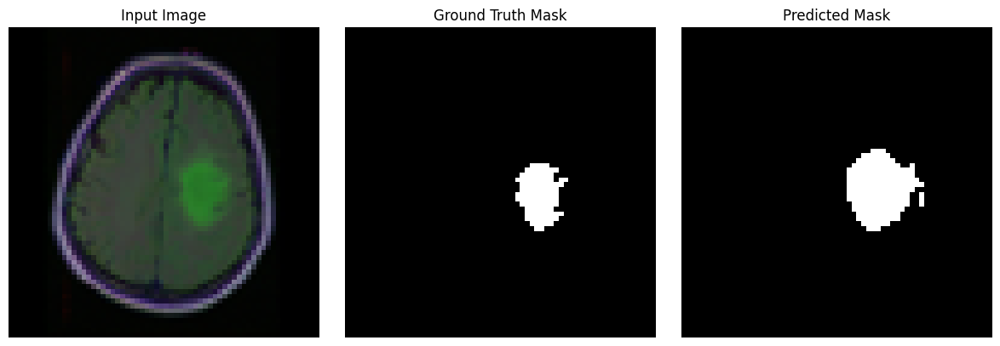

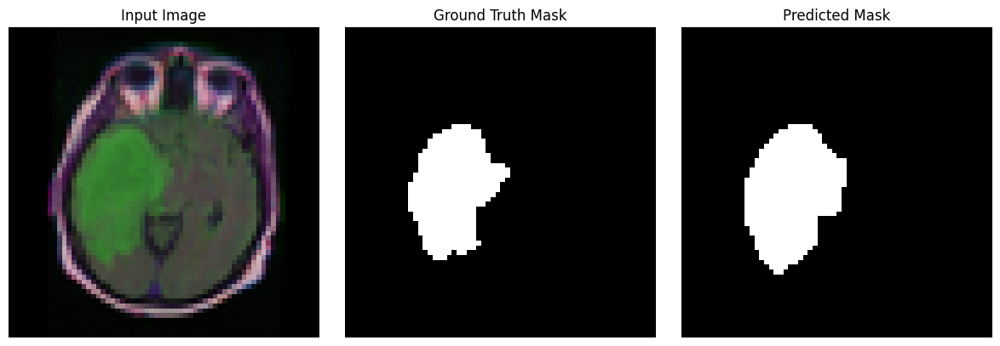

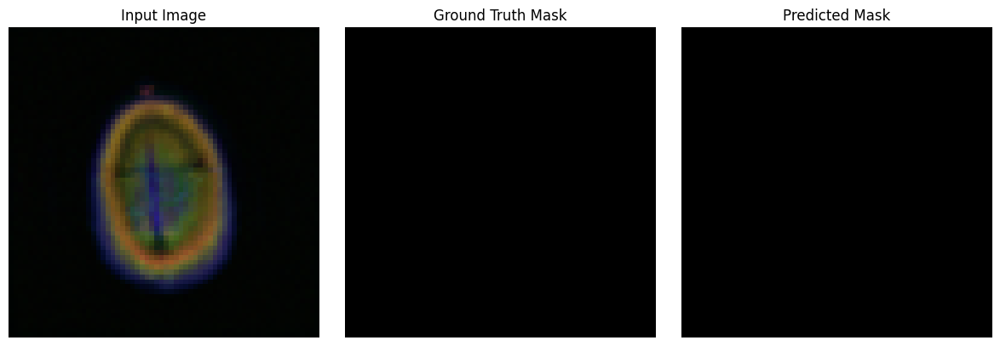

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Number of random samples to display
num_samples = 5

# Get a batch of data (you can combine multiple batches if needed)
imgs, true_masks = test_gen[0]  # Only the first batch
pred_masks = model.predict(imgs)
pred_masks = (pred_masks > 0.5).astype(np.float32)

# Randomly select 5 indices from the batch
random_indices = random.sample(range(len(imgs)), num_samples)

# Display selected samples
for i in random_indices:
    input_img = imgs[i]
    true_mask = true_masks[i].squeeze()
    pred_mask = pred_masks[i].squeeze()

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(input_img)
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(true_mask, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


# **2) VAE**

## **2-2) Dataset**

### **Load datasets**
Download and unzip ixit2-slices dataset

In [ ]:
!kaggle datasets download -d haonanzhou1/ixit2-slices

!unzip -q ixit2-slices.zip -d ixit2-slices

!rm ixit2-slices.zip -f

!ls

Dataset URL: https://www.kaggle.com/datasets/haonanzhou1/ixit2-slices
License(s): unknown
100% 781M/781M [00:13<00:00, 27.8MB/s]
100% 781M/781M [00:13<00:00, 59.3MB/s]
drive  ixit2-slices  sample_data


#### Show sample image

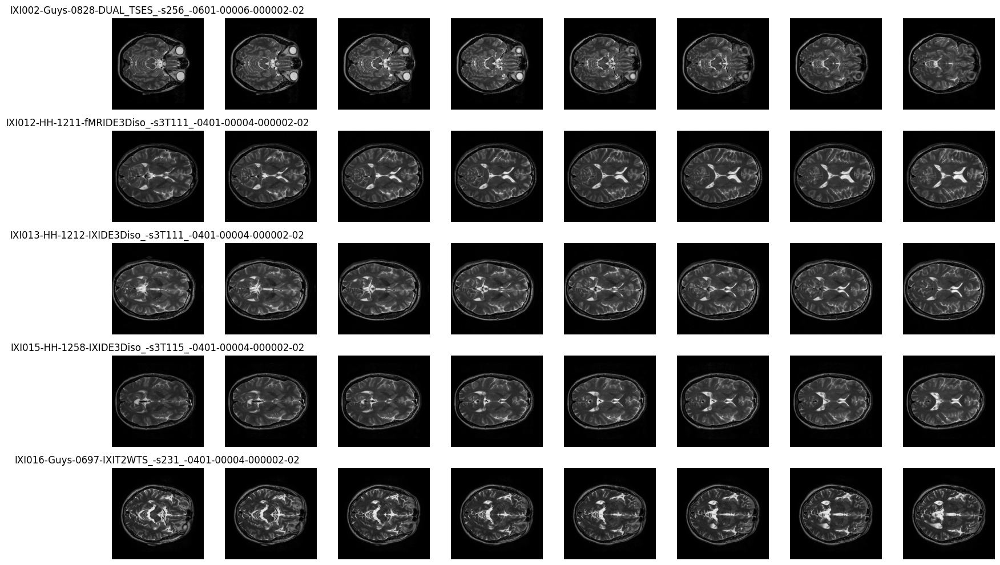

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

input_root = "ixit2-slices/image slice-T2"  # Path to the main folder

folders = sorted([f for f in os.listdir(input_root) if os.path.isdir(os.path.join(input_root, f))])

num_patients = 5          # Number of patients (folders) to display
num_images_per_patient = 8  # Number of images per patient

selected_folders = folders[:num_patients]  # Select first 5 patients

plt.figure(figsize=(num_images_per_patient * 2, num_patients * 2))  # Set figure size

for i, folder_name in enumerate(selected_folders):
    folder_path = os.path.join(input_root, folder_name)
    images = sorted([f for f in os.listdir(folder_path) if f.endswith(".png")])[:num_images_per_patient]

    for j, img_name in enumerate(images):
        img_path = os.path.join(folder_path, img_name)
        img = mpimg.imread(img_path)
        ax = plt.subplot(num_patients, num_images_per_patient, i * num_images_per_patient + j + 1)
        ax.imshow(img, cmap='gray')
        ax.axis('off')
        if j == 0:
            ax.set_ylabel(folder_name, rotation=0, labelpad=40, fontsize=10, va='center')

# Add patient titles on top of each column
for i, folder_name in enumerate(selected_folders):
    plt.subplot(num_patients, num_images_per_patient, i * num_images_per_patient + 1).set_title(folder_name, fontsize=12)

plt.tight_layout()
plt.show()

### **Preprocessing**

In [ ]:
import os
import shutil
# Path to the root folder containing patient folders
input_root = "ixit2-slices/image slice-T2"

folders = sorted([f for f in os.listdir(input_root) if os.path.isdir(os.path.join(input_root, f))])
print(f"Total folders found: {len(folders)}")

Total folders found: 577


In [ ]:
# Path to the root folder containing patient folders
input_root = "ixit2-slices/image slice-T2"  # Change this to your main folder path
# Path to the output folder where all images will be saved
output_folder = "dataset"  # Change this to your desired output folder path

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# List and sort all folders inside the input root directory
folders = sorted([f for f in os.listdir(input_root) if os.path.isdir(os.path.join(input_root, f))])

for idx, folder_name in enumerate(folders, start=1):
    prefix = f"{idx:03d}"  # Create a three-digit prefix, e.g., 001, 002, ...
    folder_path = os.path.join(input_root, folder_name)
    for file_name in os.listdir(folder_path):
        if file_name.endswith(".png"):  # Process only PNG files
            # Extract the numeric part from the file name (e.g., "49" from "49.png")
            number_part = os.path.splitext(file_name)[0]
            new_name = f"{prefix}{number_part}.png"
            src_path = os.path.join(folder_path, file_name)
            dst_path = os.path.join(output_folder, new_name)
            shutil.copy2(src_path, dst_path)
            print(f"Copied {src_path} to {dst_path}")

Streaming output truncated to the last 5000 lines.
Copied ixit2-slices/image slice-T2/IXI538-HH-2411-DE3Diso_-s3T233_-0401-00004-000002-02/51.png to dataset/47851.png
Copied ixit2-slices/image slice-T2/IXI538-HH-2411-DE3Diso_-s3T233_-0401-00004-000002-02/70.png to dataset/47870.png
Copied ixit2-slices/image slice-T2/IXI538-HH-2411-DE3Diso_-s3T233_-0401-00004-000002-02/62.png to dataset/47862.png
Copied ixit2-slices/image slice-T2/IXI538-HH-2411-DE3Diso_-s3T233_-0401-00004-000002-02/92.png to dataset/47892.png
Copied ixit2-slices/image slice-T2/IXI538-HH-2411-DE3Diso_-s3T233_-0401-00004-000002-02/95.png to dataset/47895.png
Copied ixit2-slices/image slice-T2/IXI538-HH-2411-DE3Diso_-s3T233_-0401-00004-000002-02/76.png to dataset/47876.png
Copied ixit2-slices/image slice-T2/IXI538-HH-2411-DE3Diso_-s3T233_-0401-00004-000002-02/82.png to dataset/47882.png
Copied ixit2-slices/image slice-T2/IXI538-HH-2411-DE3Diso_-s3T233_-0401-00004-000002-02/65.png to dataset/47865.png
Copied ixit2-slices/i

In [ ]:
!rm ixit2-slices -r

images = [f for f in os.listdir(output_folder) if f.endswith(".png")]

print(f"Total images in '{output_folder}': {len(images)}")

Total images in 'dataset': 28850


#### Resize images

In [ ]:
import os
from PIL import Image
from collections import Counter

output_folder = "dataset"

sizes = []

for file_name in os.listdir(output_folder):
    if file_name.endswith(".png"):
        img_path = os.path.join(output_folder, file_name)
        with Image.open(img_path) as img:
            sizes.append(img.size)  # Append (width, height) tuple

# Count occurrences of each size
size_counts = Counter(sizes)

# Get the most common size and its count
most_common_size, count = size_counts.most_common(1)[0]

print(f"Most common image size: {most_common_size} with {count} occurrences")


Most common image size: (256, 256) with 28850 occurrences


In [ ]:
from PIL import Image

# Function to resize images
def resize_images(folder_path, common_size):
    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)

        if os.path.isfile(file_path):
            try:
                img = Image.open(file_path)
                img_resized = img.resize(common_size)
                img_resized.save(file_path)
                print(f"{filename} resized to {common_size}.")
            except Exception as e:
                print(f"Error processing {filename}: {e}")

dataset_folder = 'dataset'
resize_images(dataset_folder, (128, 128))

Streaming output truncated to the last 5000 lines.
27981.png resized to (128, 128).
18251.png resized to (128, 128).
48066.png resized to (128, 128).
36650.png resized to (128, 128).
24997.png resized to (128, 128).
00367.png resized to (128, 128).
23659.png resized to (128, 128).
27153.png resized to (128, 128).
01860.png resized to (128, 128).
38173.png resized to (128, 128).
01562.png resized to (128, 128).
45593.png resized to (128, 128).
05086.png resized to (128, 128).
40473.png resized to (128, 128).
52386.png resized to (128, 128).
55397.png resized to (128, 128).
24477.png resized to (128, 128).
24877.png resized to (128, 128).
35992.png resized to (128, 128).
05376.png resized to (128, 128).
36464.png resized to (128, 128).
43376.png resized to (128, 128).
07987.png resized to (128, 128).
02387.png resized to (128, 128).
00973.png resized to (128, 128).
56976.png resized to (128, 128).
25652.png resized to (128, 128).
01861.png resized to (128, 128).
53865.png resized to (128

#### Show sample image after resize

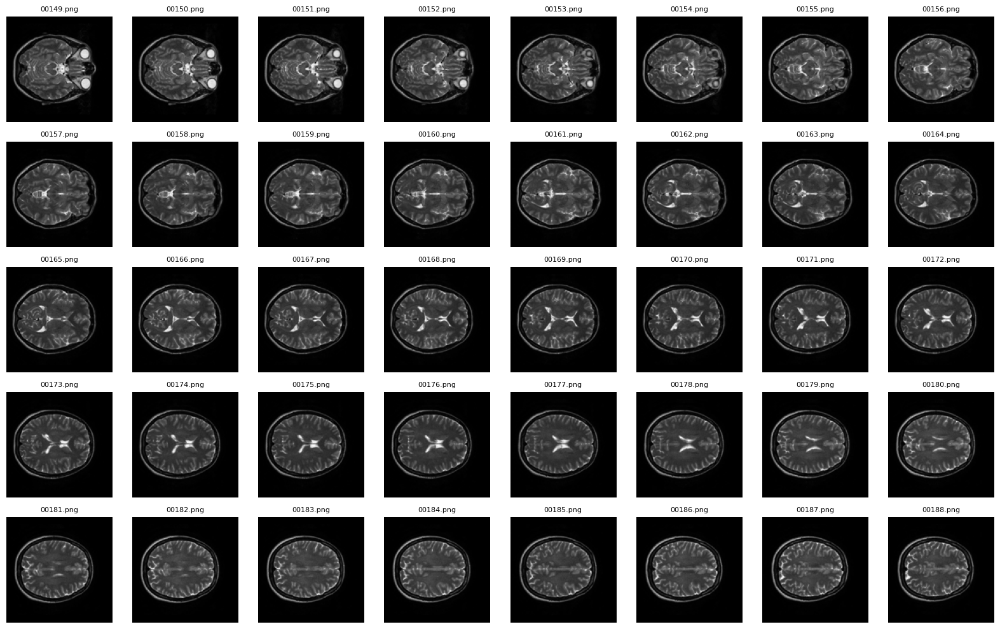

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

dataset_folder = "dataset"  # Path to the folder containing all images

num_images_to_show = 40  # Number of images to display

# List all PNG images in the folder and sort them
images = sorted([f for f in os.listdir(dataset_folder) if f.endswith(".png")])[:num_images_to_show]

# Calculate number of columns and rows for the plot grid
cols = 8
rows = (num_images_to_show + cols - 1) // cols  # ceiling division

plt.figure(figsize=(cols * 2, rows * 2))

for i, img_name in enumerate(images):
    img_path = os.path.join(dataset_folder, img_name)
    img = mpimg.imread(img_path)
    ax = plt.subplot(rows, cols, i + 1)
    ax.imshow(img, cmap='gray')
    ax.axis('off')
    ax.set_title(img_name, fontsize=8)

plt.tight_layout()
plt.show()

### **Split Dataset**

In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split

input_folder = "dataset"  # Main folder containing all images and where train/val/test will be created

# Create train, val, test folders inside the main dataset folder
for split in ['train', 'val', 'test']:
    split_path = os.path.join(input_folder, split)
    os.makedirs(split_path, exist_ok=True)

# List all PNG files in the input folder (ignore train/val/test folders)
all_files = [f for f in os.listdir(input_folder) if f.endswith('.png')]

# Extract unique patient IDs (first 3 characters of file names)
patients = sorted(list(set([f[:3] for f in all_files])))
print(f"Total patients: {len(patients)}")

# Split patients into train, validation, and test sets (70%, 15%, 15%)
train_patients, temp_patients = train_test_split(patients, test_size=0.3, random_state=42)
val_patients, test_patients = train_test_split(temp_patients, test_size=0.5, random_state=42)

print(f"Train patients: {len(train_patients)}")
print(f"Validation patients: {len(val_patients)}")
print(f"Test patients: {len(test_patients)}")

# Function to move files of a patient to corresponding folder
def move_patient_files(patient_list, split_name):
    dest_folder = os.path.join(input_folder, split_name)
    for patient in patient_list:
        patient_files = [f for f in all_files if f.startswith(patient)]
        for file_name in patient_files:
            src = os.path.join(input_folder, file_name)
            dst = os.path.join(dest_folder, file_name)
            shutil.move(src, dst)

# Move files to train, val, and test folders
move_patient_files(train_patients, 'train')
move_patient_files(val_patients, 'val')
move_patient_files(test_patients, 'test')

Total patients: 577
Train patients: 403
Validation patients: 87
Test patients: 87


## **2-3) Training Variables**

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, backend as K

# Custom Loss Layer
class VAELossLayer(layers.Layer):
    def __init__(self, input_shape, **kwargs):
        super(VAELossLayer, self).__init__(**kwargs)
        self.input_shape_ = input_shape

    def vae_loss(self, inputs, decoded, z_mean, z_log_var):
        reconstruction_loss = tf.keras.losses.binary_crossentropy(
            K.flatten(inputs), K.flatten(decoded)
        )
        reconstruction_loss *= self.input_shape_[0] * self.input_shape_[1]

        kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
        kl_loss = K.sum(kl_loss, axis=-1)
        kl_loss *= -0.5

        total_loss = K.mean(reconstruction_loss + kl_loss)

        self.add_metric(K.mean(reconstruction_loss), name="reconstruction_loss", aggregation="mean")
        self.add_metric(K.mean(kl_loss), name="kl_loss", aggregation="mean")

        return total_loss

    def call(self, inputs):
        inputs_img, decoded_img, z_mean, z_log_var = inputs
        loss = self.vae_loss(inputs_img, decoded_img, z_mean, z_log_var)
        self.add_loss(loss)
        return decoded_img

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)

## **2-4) VAE Architecture**

In [ ]:
input_shape = (128, 128, 1)
latent_dim = 10

# Encoder
inputs = layers.Input(shape=input_shape)

x = layers.Conv2D(32, 3, strides=2, padding='same', activation='relu')(inputs)
x = layers.Conv2D(64, 3, strides=2, padding='same', activation='relu')(x)
shape_before_flatten = K.int_shape(x)
x = layers.Flatten()(x)
x = layers.Dense(128, activation='relu')(x)

z_mean = layers.Dense(latent_dim, name='z_mean')(x)
z_log_var = layers.Dense(latent_dim, name='z_log_var')(x)

def sampling(args):
    z_mean, z_log_var = args
    epsilon = K.random_normal(shape=K.shape(z_mean))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

z = layers.Lambda(sampling, output_shape=(latent_dim,), name='z')([z_mean, z_log_var])

# Decoder
decoder_input = layers.Input(shape=(latent_dim,))
x = layers.Dense(np.prod(shape_before_flatten[1:]), activation='relu')(decoder_input)
x = layers.Reshape((shape_before_flatten[1], shape_before_flatten[2], shape_before_flatten[3]))(x)
x = layers.Conv2DTranspose(64, 3, strides=2, padding='same', activation='relu')(x)
x = layers.Conv2DTranspose(32, 3, strides=2, padding='same', activation='relu')(x)
decoder_output = layers.Conv2D(1, 3, padding='same', activation='sigmoid')(x)

decoder = models.Model(decoder_input, decoder_output, name='decoder')
decoded = decoder(z)

# Add custom loss layer
outputs = VAELossLayer(input_shape)([inputs, decoded, z_mean, z_log_var])

# Final model
vae = models.Model(inputs, outputs, name='vae')
vae.compile(optimizer=optimizer,
              loss=vae_loss,
              metrics=[kl_loss, reconstruction_loss])

vae.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_20      │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_30 (Conv2D)  │ (None, 64, 64,    │        320 │ input_layer_20[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_31 (Conv2D)  │ (None, 32, 32,    │     18,496 │ conv2d_30[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_10          │ (None, 65536)     │          0 │ conv2d_31[0][0]   │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_20 (Dense)    │ (None, 128)       │  8,388,736 │ flatten_10[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_mean (Dense)      │ (None, 10)        │      1,290 │ dense_20[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_log_var (Dense)   │ (None, 10)        │      1,290 │ dense_20[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z (Lambda)          │ (None, 10)        │          0 │ z_mean[0][0],     │
│                     │                   │            │ z_log_var[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ decoder             │ (None, 128, 128,  │    776,577 │ z[0][0]           │
│ (Functional)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vae_loss_layer_10   │ (None, 128, 128,  │          0 │ input_layer_20[0… │
│ (VAELossLayer)      │ 1)                │            │ decoder[0][0],    │
│                     │                   │            │ z_mean[0][0],     │
│                     │                   │            │ z_log_var[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 9,186,709 (35.04 MB)

 Trainable params: 9,186,709 (35.04 MB)

 Non-trainable params: 0 (0.00 B)

## **2-5) Model Training**

### **Data Loader**

In [ ]:
import os
import numpy as np
from tensorflow.keras.utils import Sequence
from tensorflow.keras.preprocessing.image import load_img, img_to_array

class ImageDataGenerator(Sequence):
    def __init__(self, folder_path, batch_size=32, shuffle=True):
        self.folder_path = folder_path
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.file_names = [f for f in os.listdir(folder_path) if f.endswith('.png')]
        self.on_epoch_end()

    def __len__(self):
        # Number of batches per epoch
        return int(np.ceil(len(self.file_names) / self.batch_size))

    def __getitem__(self, index):
        # Generate indexes of the batch
        batch_files = self.file_names[index * self.batch_size : (index + 1) * self.batch_size]

        # Load images for this batch
        images = [self.load_image(os.path.join(self.folder_path, f)) for f in batch_files]

        # Convert list to numpy array
        X = np.array(images, dtype=np.float32)

        # Normalize images between 0 and 1 (if not already)
        X = X / 255.0

        # For VAE input and output are the same
        return X, X

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.file_names)

    def load_image(self, image_path):
        # Load image as grayscale without resizing (keep original size)
        img = load_img(image_path, color_mode='grayscale')
        img_array = img_to_array(img)  # shape (height, width, 1)
        return img_array

# Usage:
train_generator = ImageDataGenerator(folder_path='dataset/train', batch_size=32)
val_generator = ImageDataGenerator(folder_path='dataset/val', batch_size=32)
test_generator = ImageDataGenerator(folder_path='dataset/test', batch_size=32)

### **Train**

In [ ]:
history = vae.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator,
    verbose=1
)

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


630/630 ━━━━━━━━━━━━━━━━━━━━ 999s 2s/step - kl_loss: 50.5559 - loss: 4673.4722 - reconstruction_loss: 4622.9170 - val_kl_loss: 19.7340 - val_loss: 3953.8613 - val_reconstruction_loss: 3934.1272
Epoch 2/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 1025s 2s/step - kl_loss: 20.6697 - loss: 3971.1528 - reconstruction_loss: 3950.4829 - val_kl_loss: 22.2674 - val_loss: 3917.1262 - val_reconstruction_loss: 3894.8604
Epoch 3/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 1042s 2s/step - kl_loss: 22.8496 - loss: 3920.0413 - reconstruction_loss: 3897.1919 - val_kl_loss: 23.0923 - val_loss: 3875.8350 - val_reconstruction_loss: 3852.7422
Epoch 4/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 1003s 2s/step - kl_loss: 23.9673 - loss: 3890.0322 - reconstruction_loss: 3866.0652 - val_kl_loss: 23.7887 - val_loss: 3875.7422 - val_reconstruction_loss: 3851.9539
Epoch 5/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 1039s 2s/step - kl_loss: 24.4494 - loss: 3876.5959 - reconstruction_loss: 3852.1458 - val_kl_loss: 24.0778 - val_loss: 3868.4963 - val_reconstructio

### **Plot Training and Validation Metrics**


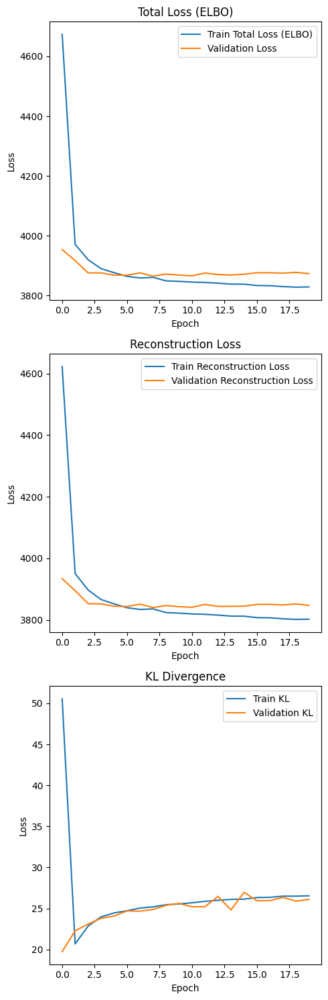

In [ ]:
plt.figure(figsize=(5, 15))

plt.subplot(3, 1, 1)
plt.plot(history["loss"], label="Train Total Loss (ELBO)")
plt.plot(history["val_loss"], label="Validation Loss")
plt.title("Total Loss (ELBO)")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(history["reconstruction_loss"], label="Train Reconstruction Loss")
plt.plot(history["val_reconstruction_loss"], label="Validation Reconstruction Loss")
plt.title("Reconstruction Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(history["kl_loss"], label="Train KL")
plt.plot(history["val_kl_loss"], label="Validation KL")
plt.title("KL Divergence")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.tight_layout()
plt.show()


## **2-6) Model Evaluation**

### **Show reconstruction of 10 samples. (latent_dim = 10)**

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


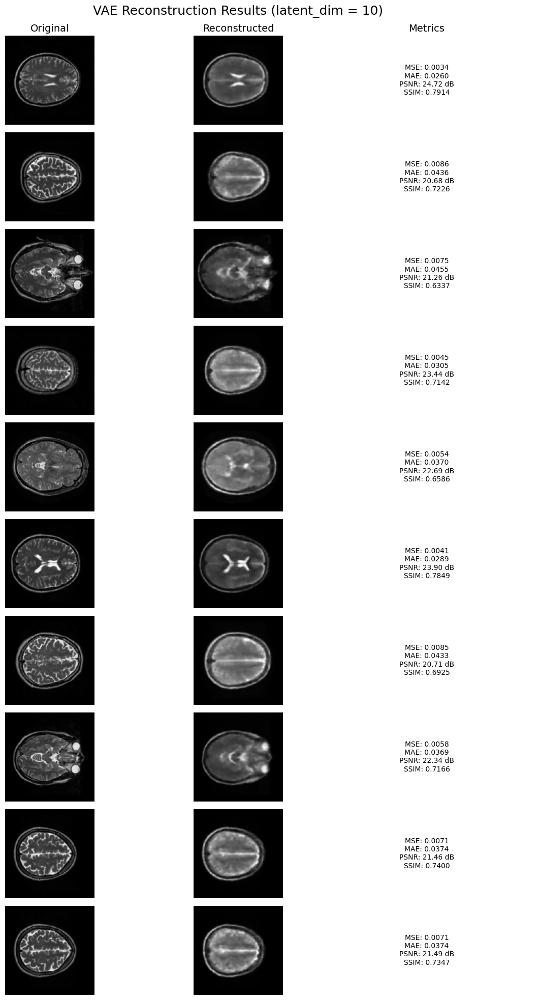

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
import tensorflow as tf

# Predict with trained VAE
x_test_batch, _ = next(iter(test_generator))  # One batch from generator
decoded_imgs = vae.predict(x_test_batch)

# Define evaluation metrics
def compute_mse(x, y):
    return np.mean((x - y) ** 2, axis=(1, 2, 3))

def compute_mae(x, y):
    return np.mean(np.abs(x - y), axis=(1, 2, 3))

def compute_psnr(x, y):
    return tf.image.psnr(x, y, max_val=1.0).numpy()

def compute_ssim_batch(x, y):
    scores = []
    for i in range(x.shape[0]):
        score, _ = ssim(x[i].squeeze(), y[i].squeeze(), full=True, data_range=1.0)
        scores.append(score)
    return np.array(scores)

# Compute all metrics
mse_errors = compute_mse(x_test_batch, decoded_imgs)
mae_errors = compute_mae(x_test_batch, decoded_imgs)
psnr_scores = compute_psnr(x_test_batch, decoded_imgs)
ssim_scores = compute_ssim_batch(x_test_batch, decoded_imgs)

# Visualize results with headers only once
n = min(10, len(x_test_batch))
plt.figure(figsize=(12, 20))

for i in range(n):
    # Original image
    ax = plt.subplot(n, 3, i * 3 + 1)
    plt.imshow(x_test_batch[i].squeeze(), cmap='gray')
    ax.axis('off')
    if i == 0:
        ax.set_title("Original", fontsize=14)

    # Reconstructed image
    ax = plt.subplot(n, 3, i * 3 + 2)
    plt.imshow(decoded_imgs[i].squeeze(), cmap='gray')
    ax.axis('off')
    if i == 0:
        ax.set_title("Reconstructed", fontsize=14)

    # Metrics text
    ax = plt.subplot(n, 3, i * 3 + 3)
    ax.text(0.5, 0.5,
            f"MSE: {mse_errors[i]:.4f}\nMAE: {mae_errors[i]:.4f}\nPSNR: {psnr_scores[i]:.2f} dB\nSSIM: {ssim_scores[i]:.4f}",
            fontsize=10, ha='center', va='center')
    ax.axis('off')
    if i == 0:
        ax.set_title("Metrics", fontsize=14)

plt.tight_layout()
plt.suptitle("VAE Reconstruction Results (latent_dim = 10)", fontsize=18)
plt.subplots_adjust(top=0.95)
plt.show()


### **Image construction from random latent vector. (latent_dim = 10)**

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


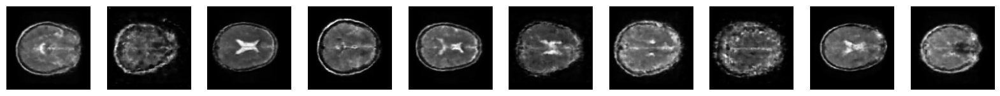

In [ ]:
random_latent_vectors = np.random.normal(size=(10, latent_dim))
generated_images = decoder.predict(random_latent_vectors)

plt.figure(figsize=(20, 2))
for i in range(10):
    ax = plt.subplot(1, 10, i + 1)
    plt.imshow(generated_images[i].squeeze(), cmap='gray')
    ax.axis('off')
plt.show()


### **Models with other latent_dim**

#### **Model with latent_dim = 2**

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, backend as K

latent_dim = 2

# Custom Loss Layer
class VAELossLayer(layers.Layer):
    def __init__(self, input_shape, **kwargs):
        super(VAELossLayer, self).__init__(**kwargs)
        self.input_shape_ = input_shape

    def vae_loss(self, inputs, decoded, z_mean, z_log_var):
        reconstruction_loss = tf.keras.losses.binary_crossentropy(
            K.flatten(inputs), K.flatten(decoded)
        )
        reconstruction_loss *= self.input_shape_[0] * self.input_shape_[1]

        kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
        kl_loss = K.sum(kl_loss, axis=-1)
        kl_loss *= -0.5

        return K.mean(reconstruction_loss + kl_loss)

    def call(self, inputs):
        inputs_img, decoded_img, z_mean, z_log_var = inputs
        loss = self.vae_loss(inputs_img, decoded_img, z_mean, z_log_var)
        self.add_loss(loss)
        return decoded_img

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)

input_shape = (128, 128, 1)

# Encoder
inputs = layers.Input(shape=input_shape)

x = layers.Conv2D(32, 3, strides=2, padding='same', activation='relu')(inputs)
x = layers.Conv2D(64, 3, strides=2, padding='same', activation='relu')(x)
shape_before_flatten = K.int_shape(x)
x = layers.Flatten()(x)
x = layers.Dense(128, activation='relu')(x)

z_mean = layers.Dense(latent_dim, name='z_mean')(x)
z_log_var = layers.Dense(latent_dim, name='z_log_var')(x)

def sampling(args):
    z_mean, z_log_var = args
    epsilon = K.random_normal(shape=K.shape(z_mean))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

z = layers.Lambda(sampling, output_shape=(latent_dim,), name='z')([z_mean, z_log_var])

# Decoder
decoder_input = layers.Input(shape=(latent_dim,))
x = layers.Dense(np.prod(shape_before_flatten[1:]), activation='relu')(decoder_input)
x = layers.Reshape((shape_before_flatten[1], shape_before_flatten[2], shape_before_flatten[3]))(x)
x = layers.Conv2DTranspose(64, 3, strides=2, padding='same', activation='relu')(x)
x = layers.Conv2DTranspose(32, 3, strides=2, padding='same', activation='relu')(x)
decoder_output = layers.Conv2D(1, 3, padding='same', activation='sigmoid')(x)

decoder = models.Model(decoder_input, decoder_output, name='decoder')
decoded = decoder(z)

# Add custom loss layer
outputs = VAELossLayer(input_shape)([inputs, decoded, z_mean, z_log_var])

# Final model
vae_l2 = models.Model(inputs, outputs, name='vae_l2')
vae_l2.compile(optimizer=optimizer)

history2 = vae_l2.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator,
    verbose=1
)

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


630/630 ━━━━━━━━━━━━━━━━━━━━ 976s 2s/step - loss: 4994.7910 - val_loss: 4055.9844
Epoch 2/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 997s 2s/step - loss: 4076.3730 - val_loss: 4009.0183
Epoch 3/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 956s 2s/step - loss: 4035.0435 - val_loss: 3997.6704
Epoch 4/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 973s 2s/step - loss: 4022.7754 - val_loss: 3992.5691
Epoch 5/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 963s 2s/step - loss: 4011.6531 - val_loss: 3985.3962
Epoch 6/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 932s 1s/step - loss: 4006.8020 - val_loss: 3983.8203
Epoch 7/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 946s 2s/step - loss: 4008.8384 - val_loss: 3983.8152
Epoch 8/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 989s 2s/step - loss: 4004.6890 - val_loss: 3985.1753
Epoch 9/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 1049s 2s/step - loss: 4003.6831 - val_loss: 3986.4565
Epoch 10/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 982s 2s/step - loss: 4003.6675 - val_loss: 3984.2842
Epoch 11/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 952s 2s/step - loss: 3999.2017 - val_l

##### **Show reconstruction of 10 samples. (latent_dim = 2)**

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 821ms/step


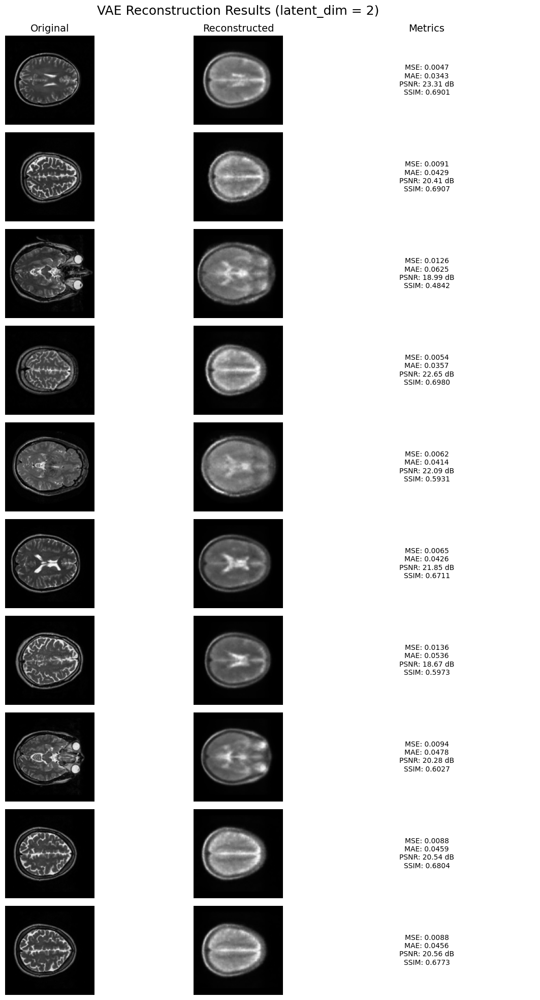

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
import tensorflow as tf

# Predict with trained VAE
x_test_batch, _ = next(iter(test_generator))  # One batch from generator
decoded_imgs = vae_l2.predict(x_test_batch)

# Define evaluation metrics
def compute_mse(x, y):
    return np.mean((x - y) ** 2, axis=(1, 2, 3))

def compute_mae(x, y):
    return np.mean(np.abs(x - y), axis=(1, 2, 3))

def compute_psnr(x, y):
    return tf.image.psnr(x, y, max_val=1.0).numpy()

def compute_ssim_batch(x, y):
    scores = []
    for i in range(x.shape[0]):
        score, _ = ssim(x[i].squeeze(), y[i].squeeze(), full=True, data_range=1.0)
        scores.append(score)
    return np.array(scores)

# Compute all metrics
mse_errors = compute_mse(x_test_batch, decoded_imgs)
mae_errors = compute_mae(x_test_batch, decoded_imgs)
psnr_scores = compute_psnr(x_test_batch, decoded_imgs)
ssim_scores = compute_ssim_batch(x_test_batch, decoded_imgs)

# Visualize results with headers only once
n = min(10, len(x_test_batch))
plt.figure(figsize=(12, 20))

for i in range(n):
    # Original image
    ax = plt.subplot(n, 3, i * 3 + 1)
    plt.imshow(x_test_batch[i].squeeze(), cmap='gray')
    ax.axis('off')
    if i == 0:
        ax.set_title("Original", fontsize=14)

    # Reconstructed image
    ax = plt.subplot(n, 3, i * 3 + 2)
    plt.imshow(decoded_imgs[i].squeeze(), cmap='gray')
    ax.axis('off')
    if i == 0:
        ax.set_title("Reconstructed", fontsize=14)

    # Metrics text
    ax = plt.subplot(n, 3, i * 3 + 3)
    ax.text(0.5, 0.5,
            f"MSE: {mse_errors[i]:.4f}\nMAE: {mae_errors[i]:.4f}\nPSNR: {psnr_scores[i]:.2f} dB\nSSIM: {ssim_scores[i]:.4f}",
            fontsize=10, ha='center', va='center')
    ax.axis('off')
    if i == 0:
        ax.set_title("Metrics", fontsize=14)

plt.tight_layout()
plt.suptitle("VAE Reconstruction Results (latent_dim = 2)", fontsize=18)
plt.subplots_adjust(top=0.95)
plt.show()


#### **Model with latent_dim = 20**

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, backend as K

latent_dim = 20

# Custom Loss Layer
class VAELossLayer(layers.Layer):
    def __init__(self, input_shape, **kwargs):
        super(VAELossLayer, self).__init__(**kwargs)
        self.input_shape_ = input_shape

    def vae_loss(self, inputs, decoded, z_mean, z_log_var):
        reconstruction_loss = tf.keras.losses.binary_crossentropy(
            K.flatten(inputs), K.flatten(decoded)
        )
        reconstruction_loss *= self.input_shape_[0] * self.input_shape_[1]

        kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
        kl_loss = K.sum(kl_loss, axis=-1)
        kl_loss *= -0.5

        return K.mean(reconstruction_loss + kl_loss)

    def call(self, inputs):
        inputs_img, decoded_img, z_mean, z_log_var = inputs
        loss = self.vae_loss(inputs_img, decoded_img, z_mean, z_log_var)
        self.add_loss(loss)
        return decoded_img

optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)

input_shape = (128, 128, 1)

# Encoder
inputs = layers.Input(shape=input_shape)

x = layers.Conv2D(32, 3, strides=2, padding='same', activation='relu')(inputs)
x = layers.Conv2D(64, 3, strides=2, padding='same', activation='relu')(x)
shape_before_flatten = K.int_shape(x)
x = layers.Flatten()(x)
x = layers.Dense(128, activation='relu')(x)

z_mean = layers.Dense(latent_dim, name='z_mean')(x)
z_log_var = layers.Dense(latent_dim, name='z_log_var')(x)

def sampling(args):
    z_mean, z_log_var = args
    epsilon = K.random_normal(shape=K.shape(z_mean))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

z = layers.Lambda(sampling, output_shape=(latent_dim,), name='z')([z_mean, z_log_var])

# Decoder
decoder_input = layers.Input(shape=(latent_dim,))
x = layers.Dense(np.prod(shape_before_flatten[1:]), activation='relu')(decoder_input)
x = layers.Reshape((shape_before_flatten[1], shape_before_flatten[2], shape_before_flatten[3]))(x)
x = layers.Conv2DTranspose(64, 3, strides=2, padding='same', activation='relu')(x)
x = layers.Conv2DTranspose(32, 3, strides=2, padding='same', activation='relu')(x)
decoder_output = layers.Conv2D(1, 3, padding='same', activation='sigmoid')(x)

decoder = models.Model(decoder_input, decoder_output, name='decoder')
decoded = decoder(z)

# Add custom loss layer
outputs = VAELossLayer(input_shape)([inputs, decoded, z_mean, z_log_var])

# Final model
vae_l20 = models.Model(inputs, outputs, name='vae_l20')
vae_l20.compile(optimizer=optimizer)

history3 = vae_l20.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator,
    verbose=1
)

Epoch 1/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 974s 2s/step - loss: 4596.2539 - val_loss: 3944.5757
Epoch 2/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 1009s 2s/step - loss: 3951.3928 - val_loss: 3889.9380
Epoch 3/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 967s 2s/step - loss: 3900.2830 - val_loss: 3871.9121
Epoch 4/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 992s 2s/step - loss: 3874.0149 - val_loss: 3862.6299
Epoch 5/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 1014s 2s/step - loss: 3860.3291 - val_loss: 3860.4561
Epoch 6/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 1031s 2s/step - loss: 3854.4177 - val_loss: 3855.2727
Epoch 7/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 1005s 2s/step - loss: 3845.6067 - val_loss: 3855.8125
Epoch 8/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 963s 2s/step - loss: 3837.0889 - val_loss: 3854.4072
Epoch 9/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 1014s 2s/step - loss: 3834.4470 - val_loss: 3854.1846
Epoch 10/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 973s 2s/step - loss: 3827.6362 - val_loss: 3853.3506
Epoch 11/20
630/630 ━━━━━━━━━━━━━━━━━━━━ 976s 2s/step - loss: 38

##### **Show reconstruction of 10 samples. (latent_dim = 20)**

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step


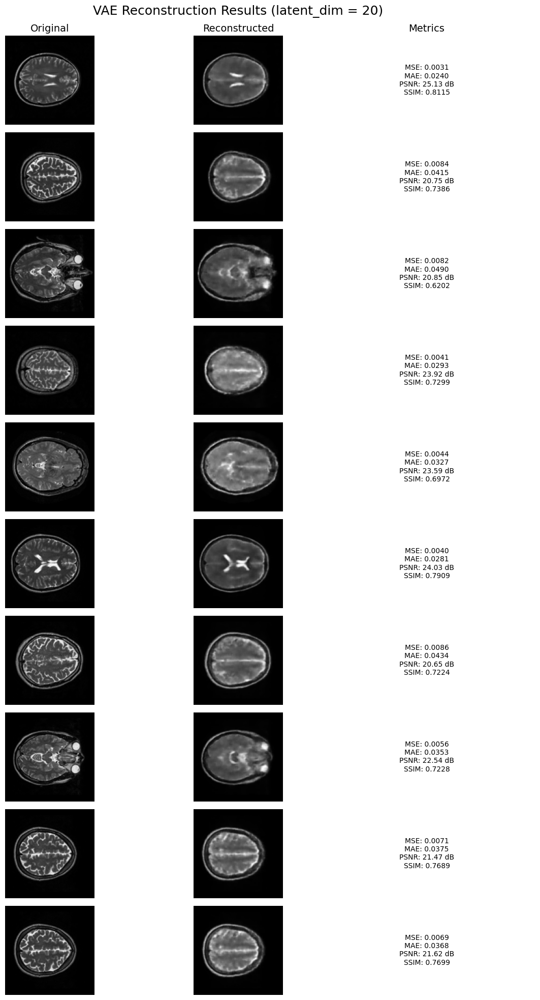

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
import tensorflow as tf

# Predict with trained VAE
x_test_batch, _ = next(iter(test_generator))  # One batch from generator
decoded_imgs = vae_l20.predict(x_test_batch)

# Define evaluation metrics
def compute_mse(x, y):
    return np.mean((x - y) ** 2, axis=(1, 2, 3))

def compute_mae(x, y):
    return np.mean(np.abs(x - y), axis=(1, 2, 3))

def compute_psnr(x, y):
    return tf.image.psnr(x, y, max_val=1.0).numpy()

def compute_ssim_batch(x, y):
    scores = []
    for i in range(x.shape[0]):
        score, _ = ssim(x[i].squeeze(), y[i].squeeze(), full=True, data_range=1.0)
        scores.append(score)
    return np.array(scores)

# Compute all metrics
mse_errors = compute_mse(x_test_batch, decoded_imgs)
mae_errors = compute_mae(x_test_batch, decoded_imgs)
psnr_scores = compute_psnr(x_test_batch, decoded_imgs)
ssim_scores = compute_ssim_batch(x_test_batch, decoded_imgs)

# Visualize results with headers only once
n = min(10, len(x_test_batch))
plt.figure(figsize=(12, 20))

for i in range(n):
    # Original image
    ax = plt.subplot(n, 3, i * 3 + 1)
    plt.imshow(x_test_batch[i].squeeze(), cmap='gray')
    ax.axis('off')
    if i == 0:
        ax.set_title("Original", fontsize=14)

    # Reconstructed image
    ax = plt.subplot(n, 3, i * 3 + 2)
    plt.imshow(decoded_imgs[i].squeeze(), cmap='gray')
    ax.axis('off')
    if i == 0:
        ax.set_title("Reconstructed", fontsize=14)

    # Metrics text
    ax = plt.subplot(n, 3, i * 3 + 3)
    ax.text(0.5, 0.5,
            f"MSE: {mse_errors[i]:.4f}\nMAE: {mae_errors[i]:.4f}\nPSNR: {psnr_scores[i]:.2f} dB\nSSIM: {ssim_scores[i]:.4f}",
            fontsize=10, ha='center', va='center')
    ax.axis('off')
    if i == 0:
        ax.set_title("Metrics", fontsize=14)

plt.tight_layout()
plt.suptitle("VAE Reconstruction Results (latent_dim = 20)", fontsize=18)
plt.subplots_adjust(top=0.95)
plt.show()


## **2-7) Anomaly Detection**

### **Load BraTS2020 Dataset**

In [ ]:
!kaggle datasets download -d awsaf49/brats20-dataset-training-validation

!unzip -q brats20-dataset-training-validation.zip -d brats20

!rm brats20-dataset-training-validation.zip -f

!ls

Dataset URL: https://www.kaggle.com/datasets/awsaf49/brats20-dataset-training-validation
License(s): CC0-1.0
100% 4.15G/4.16G [01:03<00:00, 256MB/s]
100% 4.16G/4.16G [01:03<00:00, 70.8MB/s]
brats20  drive	sample_data


In [ ]:
import pandas as pd

!ls brats20/
print(50*"-")
!ls brats20/BraTS2020_TrainingData/
print(50*"-")
!ls brats20/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/
print(50*"-")
!ls brats20/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001
print(50*"-")
df = pd.read_csv("brats20/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/name_mapping.csv")
print(df)
print(50*"-")
df2 = pd.read_csv("brats20/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/survival_info.csv")
print(df)
print(50*"-")
!ls brats20/BraTS2020_ValidationData
print(50*"-")
!ls brats20/BraTS2020_ValidationData/MICCAI_BraTS2020_ValidationData
print(50*"-")
!ls brats20/BraTS2020_ValidationData/MICCAI_BraTS2020_ValidationData/BraTS20_Validation_001
print(50*"-")
df = pd.read_csv("brats20/BraTS2020_ValidationData/MICCAI_BraTS2020_ValidationData/name_mapping_validation_data.csv")
print(df)
print(50*"-")
df2 = pd.read_csv("brats20/BraTS2020_ValidationData/MICCAI_BraTS2020_ValidationData/survival_evaluation.csv")
print(df)
print(50*"-")


BraTS2020_TrainingData	BraTS2020_ValidationData
--------------------------------------------------
MICCAI_BraTS2020_TrainingData
--------------------------------------------------
BraTS20_Training_001  BraTS20_Training_125  BraTS20_Training_249
BraTS20_Training_002  BraTS20_Training_126  BraTS20_Training_250
BraTS20_Training_003  BraTS20_Training_127  BraTS20_Training_251
BraTS20_Training_004  BraTS20_Training_128  BraTS20_Training_252
BraTS20_Training_005  BraTS20_Training_129  BraTS20_Training_253
BraTS20_Training_006  BraTS20_Training_130  BraTS20_Training_254
BraTS20_Training_007  BraTS20_Training_131  BraTS20_Training_255
BraTS20_Training_008  BraTS20_Training_132  BraTS20_Training_256
BraTS20_Training_009  BraTS20_Training_133  BraTS20_Training_257
BraTS20_Training_010  BraTS20_Training_134  BraTS20_Training_258
BraTS20_Training_011  BraTS20_Training_135  BraTS20_Training_259
BraTS20_Training_012  BraTS20_Training_136  BraTS20_Training_260
BraTS20_Training_013  BraTS20_Training_1

### **Detect anomaly in 10 samples**

In [ ]:
import os
import numpy as np
import nibabel as nib
import cv2
import matplotlib.pyplot as plt
import pandas as pd

# Load a single 2D slice from a NIfTI file
def load_nifti_slice(file_path, slice_index):
    img_data = nib.load(file_path).get_fdata()
    return img_data[:, :, slice_index]

# Normalize and resize the image slice
def preprocess_slice(slice_img, target_size=(128, 128)):
    slice_img = slice_img.astype(np.float32)
    slice_img = (slice_img - slice_img.min()) / (slice_img.max() - slice_img.min() + 1e-8)
    slice_img = cv2.resize(slice_img, target_size, interpolation=cv2.INTER_LINEAR)
    return np.expand_dims(slice_img, axis=-1)

# Resize and binarize the tumor mask
def preprocess_mask(mask_slice, target_size=(128, 128)):
    mask = cv2.resize(mask_slice, target_size, interpolation=cv2.INTER_NEAREST)
    return (mask > 0).astype(np.uint8)

# Load T2 slices and corresponding tumor masks from BraTS folders
def load_brats_slices_with_masks(folder_paths, slices_per_patient=1, target_size=(128, 128), max_samples=10):
    X, masks, info = [], [], []
    for folder_path in folder_paths:
        t2_path, seg_path = None, None
        for f in os.listdir(folder_path):
            if "t2" in f.lower() and f.endswith((".nii", ".nii.gz")):
                t2_path = os.path.join(folder_path, f)
            elif "seg" in f.lower() and f.endswith((".nii", ".nii.gz")):
                seg_path = os.path.join(folder_path, f)
        if not t2_path or not seg_path:
            continue

        t2_img = nib.load(t2_path).get_fdata()
        seg_img = nib.load(seg_path).get_fdata()
        mid_slice = t2_img.shape[2] // 2

        for i in range(slices_per_patient):
            idx = mid_slice + i
            if idx >= t2_img.shape[2]:
                break
            img_slice = preprocess_slice(t2_img[:, :, idx], target_size)
            mask_slice = preprocess_mask(seg_img[:, :, idx], target_size)
            X.append(img_slice)
            masks.append(mask_slice)
            info.append((os.path.basename(folder_path), idx))
            if len(X) >= max_samples:
                return np.array(X), np.array(masks), info
    return np.array(X), np.array(masks), info

# Set base directories for BraTS dataset
base_dir = "brats20"
subdirs = ["BraTS2020_TrainingData", "BraTS2020_ValidationData"]
patients_folders = []

# Gather all patient folders
for subdir in subdirs:
    sub_path = os.path.join(base_dir, subdir)
    if os.path.exists(sub_path):
        for d in os.listdir(sub_path):
            d_path = os.path.join(sub_path, d)
            if os.path.isdir(d_path):
                for p in os.listdir(d_path):
                    p_path = os.path.join(d_path, p)
                    if os.path.isdir(p_path):
                        patients_folders.append(p_path)

# Load data (images and masks)
X_samples, masks, info = load_brats_slices_with_masks(patients_folders, slices_per_patient=1, max_samples=10)

if X_samples.size == 0:
    raise RuntimeError("No slices loaded. Check your dataset folders and files.")

# Reconstruct images using a trained VAE model (assumed to be already defined as `vae`)
X_pred = vae.predict(X_samples)

# Compute reconstruction errors
total_errors, tumor_errors, background_errors = [], [], []
for i in range(len(X_samples)):
    orig = X_samples[i].squeeze()
    recon = X_pred[i].squeeze()
    mask = masks[i]

    mse_total = np.mean((orig - recon)**2)
    mse_tumor = np.mean((orig[mask == 1] - recon[mask == 1])**2) if np.any(mask == 1) else 0.0
    mse_background = np.mean((orig[mask == 0] - recon[mask == 0])**2)

    total_errors.append(mse_total)
    tumor_errors.append(mse_tumor)
    background_errors.append(mse_background)

# Create a DataFrame to show errors
df = pd.DataFrame({
    "Patient": [info[i][0] for i in range(len(info))],
    "Slice Index": [info[i][1] for i in range(len(info))],
    "Reconstruction MSE (total)": total_errors,
    "Reconstruction MSE (tumor)": tumor_errors,
    "Reconstruction MSE (background)": background_errors
})
df

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


,Patient,Slice Index,Reconstruction MSE (total),Reconstruction MSE (tumor),Reconstruction MSE (background)
0,BraTS20_Training_299,77,0.010282,0.039425,0.009014
1,BraTS20_Training_325,77,0.024441,0.000000,0.024441
2,BraTS20_Training_064,77,0.010389,0.046723,0.009609
3,BraTS20_Training_137,77,0.011901,0.077665,0.007406
4,BraTS20_Training_045,77,0.014630,0.033155,0.013930
5,BraTS20_Training_185,77,0.010838,0.017757,0.010728
6,BraTS20_Training_033,77,0.013173,0.164396,0.009669
7,BraTS20_Training_147,77,0.013168,0.041336,0.011613
8,BraTS20_Training_041,77,0.015179,0.046097,0.014453
9,BraTS20_Training_317,77,0.013782,0.093720,0.012689


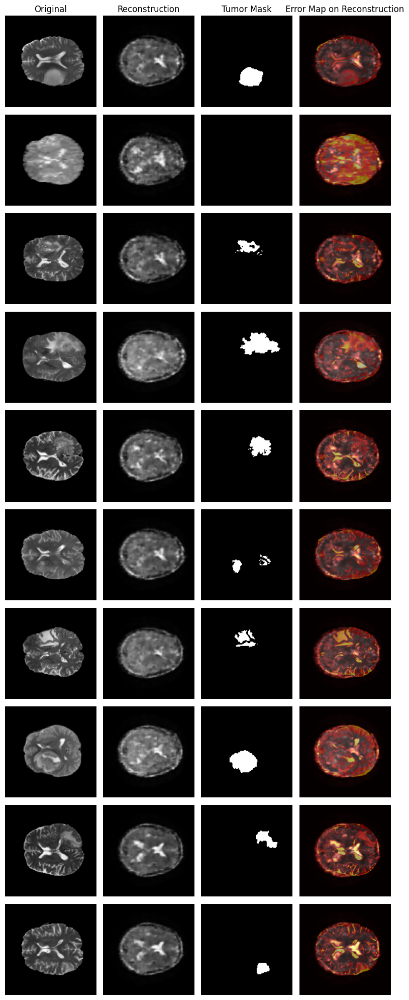

In [ ]:
# Display results for 10 samples
n_display = min(10, len(X_samples))
plt.figure(figsize=(8, n_display * 2))

for i in range(n_display):
    orig = X_samples[i].squeeze()
    recon = X_pred[i].squeeze()
    mask = masks[i]
    error_map = np.abs(orig - recon)

    # Column 1: Original image
    plt.subplot(n_display, 4, 4*i + 1)
    plt.imshow(orig, cmap='gray')
    if i == 0:
        plt.title("Original")
    plt.axis('off')

    # Column 2: Reconstructed image
    plt.subplot(n_display, 4, 4*i + 2)
    plt.imshow(recon, cmap='gray')
    if i == 0:
        plt.title("Reconstruction")
    plt.axis('off')

    # Column 3: Tumor mask
    plt.subplot(n_display, 4, 4*i + 3)
    plt.imshow(mask, cmap='gray')
    if i == 0:
        plt.title("Tumor Mask")
    plt.axis('off')

    # Column 4: Error map overlayed on reconstruction
    plt.subplot(n_display, 4, 4*i + 4)
    plt.imshow(recon, cmap='gray')               # Base image
    plt.imshow(error_map, cmap='hot', alpha=0.5)  # Error overlay
    if i == 0:
        plt.title("Error Map on Reconstruction")
    plt.axis('off')

plt.tight_layout()
plt.show()

# **3) YOLO**

## **3-2) Dataset**

### **Load datasets**
Download and unzip medical-image-dataset-brain-tumor-detection dataset






In [ ]:
!kaggle datasets download -d pkdarabi/medical-image-dataset-brain-tumor-detection

!unzip -q medical-image-dataset-brain-tumor-detection.zip -d dataset

!rm medical-image-dataset-brain-tumor-detection.zip -f

!ls
print(50*"-")
!ls dataset/BrainTumor
print(50*"-")
!ls dataset/BrainTumor/BrainTumorYolov8
print(50*"-")
!ls dataset/BrainTumor/BrainTumorYolov8/train

Dataset URL: https://www.kaggle.com/datasets/pkdarabi/medical-image-dataset-brain-tumor-detection
License(s): Attribution 4.0 International (CC BY 4.0)
 97% 287M/297M [00:01<00:00, 180MB/s]
100% 297M/297M [00:01<00:00, 222MB/s]
dataset  drive	runs  sample_data  yolov8n.pt
--------------------------------------------------
BrainTumorYolov11  BrainTumorYolov8  BrainTumorYolov9
--------------------------------------------------
data.yaml  test  train	valid
--------------------------------------------------
images	labels


## **3-3) Train**

In [ ]:
# Install required libraries
!pip install -q ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 20.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 71.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 65.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 39.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 856.2 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 66.9 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

# Load a pretrained YOLOv8 model
model = YOLO("yolov8n.pt")

# Train the model using custom dataset
model.train(
    data="/content/dataset/BrainTumor/BrainTumorYolov8/data.yaml",
    epochs=20,
    imgsz=320,
    batch=16,
    workers=2,
    name="brain_tumor_yolov8"
)

Ultralytics 8.3.146 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/BrainTumor/BrainTumorYolov8/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=320, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=brain_tumor_yolov8, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0

train: Scanning /content/dataset/BrainTumor/BrainTumorYolov8/train/labels.cache... 2144 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2144/2144 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 2143, len(boxes) = 2144. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 505.0±294.8 MB/s, size: 34.0 KB)



val: Scanning /content/dataset/BrainTumor/BrainTumorYolov8/valid/labels.cache... 612 images, 0 backgrounds, 0 corrupt: 100%|██████████| 612/612 [00:00<?, ?it/s]


Plotting labels to runs/detect/brain_tumor_yolov8/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 320 train, 320 val
Using 0 dataloader workers
Logging results to runs/detect/brain_tumor_yolov8
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20         0G        1.4      2.824        1.3         29        320: 100%|██████████| 134/134 [10:19<00:00,  4.63s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:11<00:00,  3.57s/it]

                   all        612        612      0.446      0.394      0.377      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20         0G      1.362      1.924      1.289         18        320: 100%|██████████| 134/134 [10:18<00:00,  4.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:09<00:00,  3.46s/it]


                   all        612        612      0.596      0.576      0.608      0.415

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20         0G       1.39      1.739      1.308         29        320: 100%|██████████| 134/134 [10:08<00:00,  4.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:06<00:00,  3.35s/it]

                   all        612        612      0.578      0.631       0.59      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20         0G      1.378      1.642      1.286         20        320: 100%|██████████| 134/134 [10:20<00:00,  4.63s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:10<00:00,  3.53s/it]

                   all        612        612      0.644      0.636      0.641      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20         0G      1.319      1.494      1.265         30        320: 100%|██████████| 134/134 [10:09<00:00,  4.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:06<00:00,  3.34s/it]

                   all        612        612      0.757      0.714      0.768      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20         0G      1.269      1.391      1.253         24        320: 100%|██████████| 134/134 [09:48<00:00,  4.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:05<00:00,  3.26s/it]

                   all        612        612      0.679      0.622      0.679      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20         0G      1.238      1.295      1.228         16        320: 100%|██████████| 134/134 [09:34<00:00,  4.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:04<00:00,  3.23s/it]

                   all        612        612       0.76      0.694      0.771      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20         0G      1.202      1.222      1.197         23        320: 100%|██████████| 134/134 [09:33<00:00,  4.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:05<00:00,  3.25s/it]

                   all        612        612       0.79      0.778      0.828      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20         0G      1.174      1.207      1.183         29        320: 100%|██████████| 134/134 [09:36<00:00,  4.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:06<00:00,  3.31s/it]

                   all        612        612      0.734      0.768      0.779      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20         0G      1.156      1.133      1.188         30        320: 100%|██████████| 134/134 [09:39<00:00,  4.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:06<00:00,  3.31s/it]

                   all        612        612      0.791      0.799      0.828      0.597


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20         0G       1.06      1.022      1.137         16        320: 100%|██████████| 134/134 [09:55<00:00,  4.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:04<00:00,  3.20s/it]

                   all        612        612      0.805      0.787      0.834      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20         0G      1.042     0.9635      1.129         16        320: 100%|██████████| 134/134 [09:59<00:00,  4.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:08<00:00,  3.45s/it]

                   all        612        612      0.852      0.803       0.88      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20         0G      1.013     0.8867      1.106         16        320: 100%|██████████| 134/134 [10:02<00:00,  4.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:05<00:00,  3.25s/it]

                   all        612        612      0.865      0.816      0.884      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20         0G     0.9825     0.8348      1.096         16        320: 100%|██████████| 134/134 [10:06<00:00,  4.53s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:08<00:00,  3.40s/it]

                   all        612        612      0.835       0.86      0.894      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20         0G     0.9586     0.7937      1.075         16        320: 100%|██████████| 134/134 [10:04<00:00,  4.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:09<00:00,  3.47s/it]

                   all        612        612      0.886      0.818      0.889      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20         0G      0.935      0.762      1.065         16        320: 100%|██████████| 134/134 [09:57<00:00,  4.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:07<00:00,  3.37s/it]

                   all        612        612       0.86      0.839        0.9      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20         0G     0.9208     0.7308      1.061         16        320: 100%|██████████| 134/134 [09:43<00:00,  4.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:07<00:00,  3.39s/it]

                   all        612        612      0.868      0.855       0.91      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20         0G     0.8961     0.6959      1.038         15        320: 100%|██████████| 134/134 [10:03<00:00,  4.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:04<00:00,  3.21s/it]

                   all        612        612      0.872      0.877      0.915      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20         0G     0.8836     0.6598      1.031         16        320: 100%|██████████| 134/134 [09:51<00:00,  4.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:04<00:00,  3.25s/it]

                   all        612        612      0.892       0.87      0.918      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20         0G      0.859     0.6435       1.02         16        320: 100%|██████████| 134/134 [09:54<00:00,  4.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:06<00:00,  3.32s/it]

                   all        612        612      0.886      0.873      0.923      0.707



20 epochs completed in 3.693 hours.
Optimizer stripped from runs/detect/brain_tumor_yolov8/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/brain_tumor_yolov8/weights/best.pt, 6.2MB

Validating runs/detect/brain_tumor_yolov8/weights/best.pt...
Ultralytics 8.3.146 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:02<00:00,  3.15s/it]


                   all        612        612      0.886      0.873      0.923      0.706
                glioma        285        285      0.821      0.741       0.83      0.555
            meningioma        142        142      0.944      0.948      0.976      0.833
             pituitary        185        185      0.894       0.93      0.964      0.731
Speed: 1.0ms preprocess, 91.0ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/brain_tumor_yolov8


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fc95feb4110>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

### **Show samples on test images**

In [ ]:
# Run predictions on test images
results = model.predict(
    source="/content/dataset/BrainTumor/BrainTumorYolov8/test/images",  # Test image directory
    save=True,
    imgsz=320,
    conf=0.25
)


image 1/308 /content/dataset/BrainTumor/BrainTumorYolov8/test/images/1003_jpg.rf.028d6d76fba92dd9e5dc59dc9d0f7293.jpg: 320x320 1 pituitary, 107.0ms
image 2/308 /content/dataset/BrainTumor/BrainTumorYolov8/test/images/1012_jpg.rf.a9d8d27f5e1d382e0b93ff4a479f4519.jpg: 320x320 1 pituitary, 93.4ms
image 3/308 /content/dataset/BrainTumor/BrainTumorYolov8/test/images/1018_jpg.rf.29ed2fb6754ca58ae27204ef24344650.jpg: 320x320 1 pituitary, 90.1ms
image 4/308 /content/dataset/BrainTumor/BrainTumorYolov8/test/images/102_jpg.rf.e58e0fc30dfea3a7a410d7b901223f16.jpg: 320x320 1 meningioma, 96.1ms
image 5/308 /content/dataset/BrainTumor/BrainTumorYolov8/test/images/1033_jpg.rf.1b4c0f5bdf30ec0ba218874a3a737720.jpg: 320x320 1 pituitary, 96.6ms
image 6/308 /content/dataset/BrainTumor/BrainTumorYolov8/test/images/1037_jpg.rf.7c415f051556bbba83bc00f70fe54818.jpg: 320x320 1 pituitary, 102.6ms
image 7/308 /content/dataset/BrainTumor/BrainTumorYolov8/test/images/1041_jpg.rf.252e75e8f025b79f801db895122613d3.j

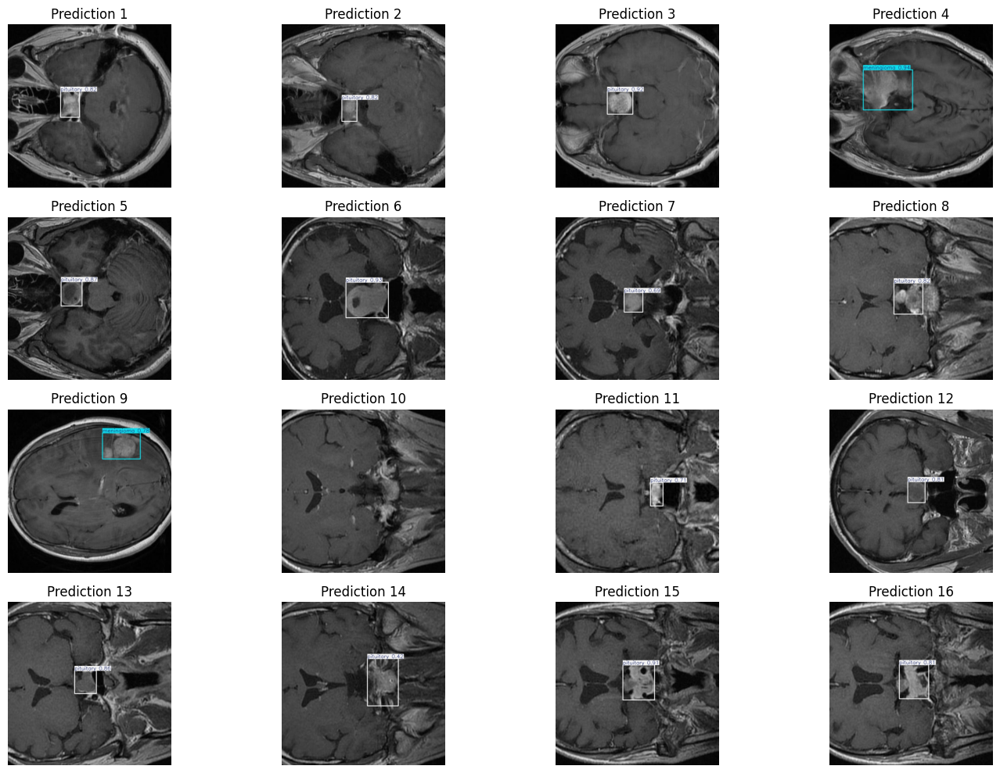

In [ ]:
import os
import matplotlib.pyplot as plt
from IPython.display import display
from PIL import Image

# Directory where YOLOv8 saved results after running predict
predicted_images_dir = "runs/detect/brain_tumor_yolov82"  # this may change if model name or run number changes

# Get list of predicted image paths
predicted_images = [os.path.join(predicted_images_dir, img) for img in os.listdir(predicted_images_dir) if img.endswith(".jpg")]

# Sort or shuffle to select a few examples
predicted_images = sorted(predicted_images)[:16]  # Show first 16 predictions

# Plot the results
plt.figure(figsize=(15, 10))
for i, image_path in enumerate(predicted_images):
    img = Image.open(image_path)
    plt.subplot(4, 4, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Prediction {i+1}")
plt.tight_layout()
plt.show()
